In [189]:
from ClassiPyGRB import SWIFT
# Packages needed for this notebook
import os
import numpy as np

In [190]:
import torch
import torch.nn as nn
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader

In [191]:
%matplotlib inline
swift = SWIFT(root_path=r'data', res=64, n_bands=[1,2,3,4,5])
print(f"Swift/BAT bands selected: {swift.bands_selected}")

Swift/BAT bands selected: ['Time(s)', '15-25keV', '25-50keV', '50-100keV', '100-350keV', '15-350keV']


In [192]:
data_loaded = np.load(os.path.join(swift.results_path, f'SWIFT_Noise_Reduced_data_{swift.res}res_{"".join(str(b) for b in swift.n_bands)}bands_DFT_True.npz'))
grb_names, features = data_loaded['names'], data_loaded['data']
durations = swift.total_durations(grb_names, t=90)

Finding Durations: 100%|██████████████████| 1513/1513 [00:09<00:00, 156.48GRB/s]


In [193]:
features.shape

(1513, 48000)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


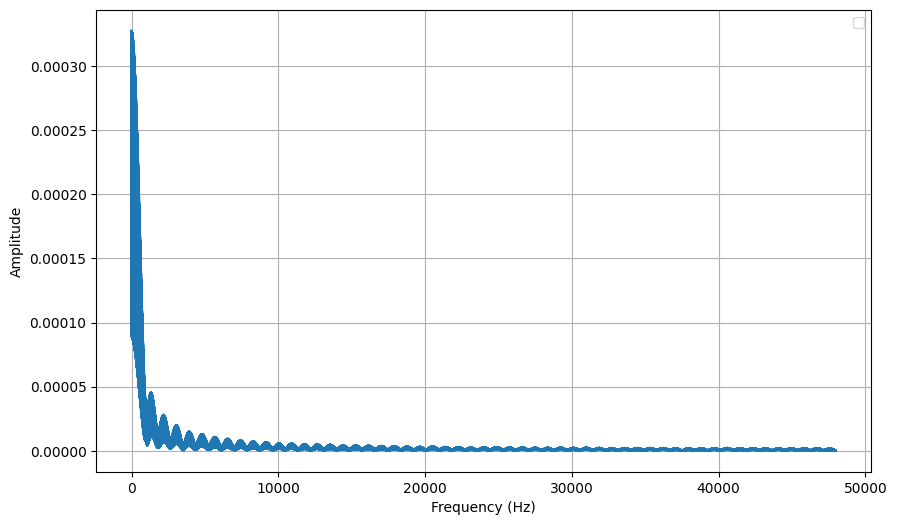

In [194]:
x = np.linspace(0, features.shape[1], features.shape[1])

plt.figure(figsize=(10, 6))
plt.plot(x, features[0])  # Converting tensor to numpy array for plotting
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')

plt.legend()
plt.grid(True)

In [195]:
features = features[:,:1000]
features.shape

(1513, 1000)

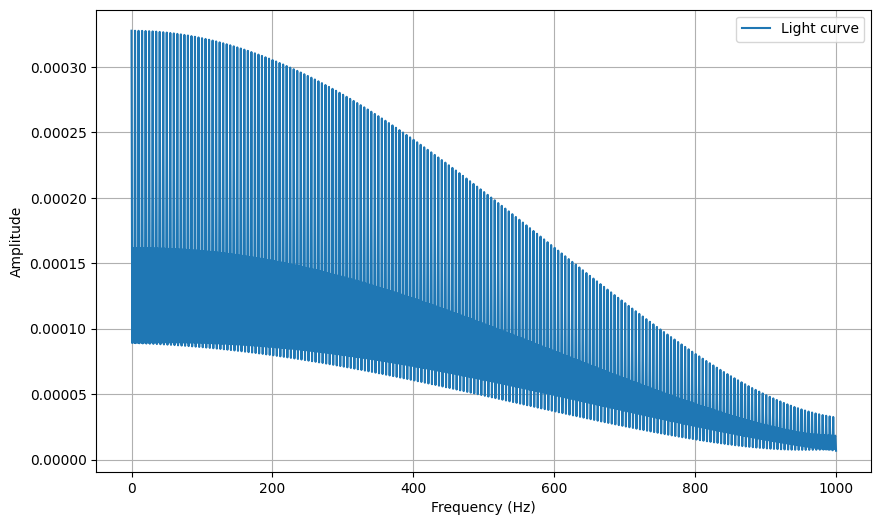

In [196]:
x = np.linspace(0, features.shape[1], features.shape[1])

plt.figure(figsize=(10, 6))
plt.plot(x, features[0], label='Light curve')  # Converting tensor to numpy array for plotting
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)

In [197]:
# Normalize the features here
normalized_features = (features - np.mean(features, axis=1, keepdims=1))/np.std(features,axis=1,keepdims=1)
print(normalized_features.shape)
print(np.mean(normalized_features,axis=1))
print(np.std(normalized_features,axis=1))

(1513, 1000)
[0.00000000e+00 5.68434189e-17 1.13686838e-16 ... 1.13686838e-16
 5.68434189e-17 0.00000000e+00]
[1. 1. 1. ... 1. 1. 1.]


In [198]:
_normalized_features = normalized_features # copy this so rerunning next cell doesn't throw error
_labels = np.zeros(shape=(normalized_features.shape[0],1))

In [199]:
normalized_features = torch.from_numpy(_normalized_features).to(torch.float32)
labels = torch.from_numpy(_labels).to(torch.float32)

In [200]:

# Split the cleaned data into training and testing sets
X_train, X_test, class_train, class_test = train_test_split(normalized_features, labels, test_size=0.2, random_state=205)


training_dataset = TensorDataset(X_train, class_train)
test_dataset = TensorDataset(X_test, class_test)

BATCHSIZE = 128
BATCHSIZE_TEST = 64

train_dataloader = DataLoader(training_dataset, batch_size=BATCHSIZE, shuffle=True)
test_dataloader  = DataLoader(test_dataset, batch_size=BATCHSIZE_TEST, shuffle=True)

In [201]:
INPUT_SIZE      = features.shape[1]
LATENT_SIZE     = 5
HIDDEN_SIZE_1     = 100

In [202]:
# Note that this code is largely from https://github.com/LSSTC-DSFP/LSSTC-DSFP-Sessions/tree/main/Sessions/Session14
# First, we will inherit from pytorch Module class; https://pytorch.org/docs/stable/generated/torch.nn.Module.html

class Encoder(nn.Module):
    def __init__(self, seed=205):
        """
        seed: int, random seed for reproducibility
        """
        super(Encoder, self).__init__()
        self.seed = torch.manual_seed(seed)
        # here we are initializing the linear layers. This registeres the layer parameters (W,b) as parameters of the Module
        self.fc1 = nn.Linear(INPUT_SIZE,HIDDEN_SIZE_1)
        self.fc2 = nn.Linear(HIDDEN_SIZE_1,LATENT_SIZE)

        # We will initialize weights following a multivariate Gaussian
        nn.init.normal_(self.fc1.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc1.bias, mean=0, std=0.01)
        nn.init.normal_(self.fc2.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc2.bias, mean=0, std=0.01)

    # this defines a forward pass of the network (="applying" the network to some input data)
    def forward(self, x):
        # print(x.dtype)
        # print(self.fc1.weight.dtype)
        # print(self.fc1.bias.dtype) # for debugging dtype mismatch
        x      = torch.nn.LeakyReLU()(self.fc1(x))
        z      = self.fc2(x)
        return z

class Decoder(nn.Module):
    def __init__(self, seed=205):
        """
        seed: int, random seed for reproducibility
        """
        super(Decoder, self).__init__()
        self.seed = torch.manual_seed(seed)
        # Using the encoder, how will you initialize two layers?
        self.fc1 = nn.Linear(LATENT_SIZE,HIDDEN_SIZE_1)
        self.fc2 = nn.Linear(HIDDEN_SIZE_1,INPUT_SIZE)

        # Using the endoer, how will you initialize the weights and biases?
        nn.init.normal_(self.fc1.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc1.bias, mean=0, std=0.01)
        nn.init.normal_(self.fc2.weight, mean=0, std=0.01)
        nn.init.normal_(self.fc2.bias, mean=0, std=0.01)

    def forward(self, z):
        # Using the encoder, how will you define the forward pass?
        # I recommend the same activation function!
        z      = torch.nn.LeakyReLU()(self.fc1(z))
        x      = self.fc2(z)
        return x

class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        # here we are creating instances of the Encoder and Decoder class
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        z = self.encoder(x)
        x = self.decoder(z)
        return x

In [203]:
# This creates an instance of the Autoencoder class
AE = Autoencoder()

In [204]:
# the training loop takes a function that loads the data batch by batch, a model to train, a loss function to train the model on and an optimizer
def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    losses = []
    # iterate over the dataset
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction of the model
        pred = model(X)
        # Compute the loss function
        loss = loss_fn(pred,X)

        # Backpropagation; this is where we take the gradient and update the network parameters
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # here we keep track of the loss
        if batch % 10 == 0:
            loss, current = loss.item(), batch * len(X)
            losses.append(loss)
            print(f"train loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

    return losses

# the test loop is similar to the training loop, only that we don't take any gradients/don't update the network parameters, but only evaluate
def test_loop(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss =  0
    with torch.no_grad():
        for (X, y) in dataloader:
            pred = model(X)
            test_loss += loss_fn(pred, X).item()

    test_loss /= num_batches
    print(f" Avg test loss: {test_loss:>8f} \n")

    return test_loss

In [205]:
features.shape

(1513, 1000)

In [206]:
from tqdm import tqdm

EPOCHS = 200
LEARNING_RATE = 1e-3


# MeanSquaredError (L2) Loss
loss_fn         = nn.MSELoss()
# Adam Optimizer
optimizer       = torch.optim.Adam(AE.parameters(), lr=LEARNING_RATE)


train_loss = []
test_loss  = []
for t in tqdm(range(EPOCHS)):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loss.append(train_loop(train_dataloader, AE, loss_fn, optimizer))
    test_loss.append(test_loop(test_dataloader, AE, loss_fn))
print("Done!")

  0%|▏                                          | 1/200 [00:00<00:20,  9.89it/s]

Epoch 1
-------------------------------
train loss: 0.999482  [    0/ 1210]
 Avg test loss: 0.946505 

Epoch 2
-------------------------------
train loss: 0.946569  [    0/ 1210]
 Avg test loss: 0.605502 

Epoch 3
-------------------------------
train loss: 0.611727  [    0/ 1210]


  2%|█                                          | 5/200 [00:00<00:12, 16.17it/s]

 Avg test loss: 0.438912 

Epoch 4
-------------------------------
train loss: 0.443501  [    0/ 1210]
 Avg test loss: 0.347703 

Epoch 5
-------------------------------
train loss: 0.361427  [    0/ 1210]
 Avg test loss: 0.297891 

Epoch 6
-------------------------------
train loss: 0.288992  [    0/ 1210]
 Avg test loss: 0.281267 

Epoch 7
-------------------------------
train loss: 0.286335  [    0/ 1210]


  4%|█▉                                         | 9/200 [00:00<00:10, 17.52it/s]

 Avg test loss: 0.275607 

Epoch 8
-------------------------------
train loss: 0.300924  [    0/ 1210]
 Avg test loss: 0.274882 

Epoch 9
-------------------------------
train loss: 0.263829  [    0/ 1210]
 Avg test loss: 0.273783 

Epoch 10
-------------------------------
train loss: 0.276977  [    0/ 1210]
 Avg test loss: 0.271395 

Epoch 11
-------------------------------
train loss: 0.303317  [    0/ 1210]


  6%|██▋                                       | 13/200 [00:00<00:10, 17.69it/s]

 Avg test loss: 0.269487 

Epoch 12
-------------------------------
train loss: 0.257888  [    0/ 1210]
 Avg test loss: 0.262217 

Epoch 13
-------------------------------
train loss: 0.275978  [    0/ 1210]
 Avg test loss: 0.209424 

Epoch 14
-------------------------------
train loss: 0.209696  [    0/ 1210]
 Avg test loss: 0.163558 

Epoch 15
-------------------------------
train loss: 0.159654  [    0/ 1210]


  8%|███▌                                      | 17/200 [00:00<00:10, 17.80it/s]

 Avg test loss: 0.144916 

Epoch 16
-------------------------------
train loss: 0.150055  [    0/ 1210]
 Avg test loss: 0.133536 

Epoch 17
-------------------------------
train loss: 0.137197  [    0/ 1210]
 Avg test loss: 0.122073 

Epoch 18
-------------------------------
train loss: 0.127313  [    0/ 1210]
 Avg test loss: 0.114154 

Epoch 19
-------------------------------
train loss: 0.111100  [    0/ 1210]


 10%|████▍                                     | 21/200 [00:01<00:10, 17.88it/s]

 Avg test loss: 0.107258 

Epoch 20
-------------------------------
train loss: 0.116635  [    0/ 1210]
 Avg test loss: 0.104774 

Epoch 21
-------------------------------
train loss: 0.112996  [    0/ 1210]
 Avg test loss: 0.101623 

Epoch 22
-------------------------------
train loss: 0.110460  [    0/ 1210]
 Avg test loss: 0.100541 

Epoch 23
-------------------------------
train loss: 0.097802  [    0/ 1210]


 12%|█████▎                                    | 25/200 [00:01<00:09, 17.86it/s]

 Avg test loss: 0.099840 

Epoch 24
-------------------------------
train loss: 0.109761  [    0/ 1210]
 Avg test loss: 0.096551 

Epoch 25
-------------------------------
train loss: 0.104562  [    0/ 1210]
 Avg test loss: 0.096184 

Epoch 26
-------------------------------
train loss: 0.088465  [    0/ 1210]
 Avg test loss: 0.093685 

Epoch 27
-------------------------------
train loss: 0.090673  [    0/ 1210]


 14%|██████                                    | 29/200 [00:01<00:09, 17.96it/s]

 Avg test loss: 0.090253 

Epoch 28
-------------------------------
train loss: 0.093554  [    0/ 1210]
 Avg test loss: 0.088253 

Epoch 29
-------------------------------
train loss: 0.071450  [    0/ 1210]
 Avg test loss: 0.086039 

Epoch 30
-------------------------------
train loss: 0.082474  [    0/ 1210]
 Avg test loss: 0.082743 

Epoch 31
-------------------------------
train loss: 0.102592  [    0/ 1210]


 16%|██████▉                                   | 33/200 [00:01<00:11, 15.08it/s]

 Avg test loss: 0.082236 

Epoch 32
-------------------------------
train loss: 0.065513  [    0/ 1210]
 Avg test loss: 0.079359 

Epoch 33
-------------------------------
train loss: 0.086094  [    0/ 1210]
 Avg test loss: 0.079911 

Epoch 34
-------------------------------
train loss: 0.084463  [    0/ 1210]


 18%|███████▊                                  | 37/200 [00:02<00:10, 14.89it/s]

 Avg test loss: 0.078209 

Epoch 35
-------------------------------
train loss: 0.090761  [    0/ 1210]
 Avg test loss: 0.078011 

Epoch 36
-------------------------------
train loss: 0.079499  [    0/ 1210]
 Avg test loss: 0.076131 

Epoch 37
-------------------------------
train loss: 0.102484  [    0/ 1210]
 Avg test loss: 0.075229 

Epoch 38
-------------------------------


 20%|████████▏                                 | 39/200 [00:02<00:11, 14.51it/s]

train loss: 0.083661  [    0/ 1210]
 Avg test loss: 0.075954 

Epoch 39
-------------------------------
train loss: 0.080334  [    0/ 1210]
 Avg test loss: 0.074056 

Epoch 40
-------------------------------
train loss: 0.090690  [    0/ 1210]
 Avg test loss: 0.073556 

Epoch 41
-------------------------------


 22%|█████████                                 | 43/200 [00:02<00:10, 14.72it/s]

train loss: 0.082369  [    0/ 1210]
 Avg test loss: 0.072965 

Epoch 42
-------------------------------
train loss: 0.064124  [    0/ 1210]
 Avg test loss: 0.072666 

Epoch 43
-------------------------------
train loss: 0.094317  [    0/ 1210]
 Avg test loss: 0.071354 

Epoch 44
-------------------------------


 22%|█████████▍                                | 45/200 [00:02<00:10, 15.30it/s]

train loss: 0.078030  [    0/ 1210]
 Avg test loss: 0.070557 

Epoch 45
-------------------------------
train loss: 0.075659  [    0/ 1210]
 Avg test loss: 0.071949 

Epoch 46
-------------------------------
train loss: 0.069459  [    0/ 1210]
 Avg test loss: 0.071519 

Epoch 47
-------------------------------
train loss: 0.075834  [    0/ 1210]


 24%|██████████▎                               | 49/200 [00:03<00:09, 16.22it/s]

 Avg test loss: 0.070894 

Epoch 48
-------------------------------
train loss: 0.070617  [    0/ 1210]
 Avg test loss: 0.069972 

Epoch 49
-------------------------------
train loss: 0.072529  [    0/ 1210]
 Avg test loss: 0.070769 

Epoch 50
-------------------------------
train loss: 0.077357  [    0/ 1210]
 Avg test loss: 0.070226 

Epoch 51
-------------------------------


 26%|██████████▋                               | 51/200 [00:03<00:09, 14.98it/s]

train loss: 0.061580  [    0/ 1210]
 Avg test loss: 0.070234 

Epoch 52
-------------------------------
train loss: 0.070906  [    0/ 1210]
 Avg test loss: 0.069867 

Epoch 53
-------------------------------
train loss: 0.072056  [    0/ 1210]


 28%|███████████▌                              | 55/200 [00:03<00:10, 14.33it/s]

 Avg test loss: 0.069350 

Epoch 54
-------------------------------
train loss: 0.068130  [    0/ 1210]
 Avg test loss: 0.068764 

Epoch 55
-------------------------------
train loss: 0.075615  [    0/ 1210]
 Avg test loss: 0.068801 

Epoch 56
-------------------------------
train loss: 0.066025  [    0/ 1210]


 28%|███████████▉                              | 57/200 [00:03<00:10, 14.17it/s]

 Avg test loss: 0.068762 

Epoch 57
-------------------------------
train loss: 0.062354  [    0/ 1210]
 Avg test loss: 0.068333 

Epoch 58
-------------------------------
train loss: 0.060239  [    0/ 1210]
 Avg test loss: 0.068193 

Epoch 59
-------------------------------
train loss: 0.083767  [    0/ 1210]


 30%|████████████▊                             | 61/200 [00:03<00:09, 14.96it/s]

 Avg test loss: 0.069932 

Epoch 60
-------------------------------
train loss: 0.072646  [    0/ 1210]
 Avg test loss: 0.068030 

Epoch 61
-------------------------------
train loss: 0.062379  [    0/ 1210]
 Avg test loss: 0.068147 

Epoch 62
-------------------------------
train loss: 0.069229  [    0/ 1210]
 Avg test loss: 0.068587 

Epoch 63
-------------------------------
train loss: 0.079584  [    0/ 1210]


 32%|█████████████▋                            | 65/200 [00:04<00:09, 14.56it/s]

 Avg test loss: 0.067492 

Epoch 64
-------------------------------
train loss: 0.075069  [    0/ 1210]
 Avg test loss: 0.067354 

Epoch 65
-------------------------------
train loss: 0.074454  [    0/ 1210]
 Avg test loss: 0.067400 

Epoch 66
-------------------------------
train loss: 0.066330  [    0/ 1210]


 34%|██████████████                            | 67/200 [00:04<00:09, 14.18it/s]

 Avg test loss: 0.066014 

Epoch 67
-------------------------------
train loss: 0.069093  [    0/ 1210]
 Avg test loss: 0.065387 

Epoch 68
-------------------------------
train loss: 0.069868  [    0/ 1210]
 Avg test loss: 0.065069 

Epoch 69
-------------------------------
train loss: 0.058656  [    0/ 1210]


 34%|██████████████▍                           | 69/200 [00:04<00:09, 13.76it/s]

 Avg test loss: 0.064248 

Epoch 70
-------------------------------
train loss: 0.067880  [    0/ 1210]
 Avg test loss: 0.062745 

Epoch 71
-------------------------------
train loss: 0.061287  [    0/ 1210]


 36%|███████████████▎                          | 73/200 [00:04<00:10, 11.98it/s]

 Avg test loss: 0.063223 

Epoch 72
-------------------------------
train loss: 0.063301  [    0/ 1210]
 Avg test loss: 0.061253 

Epoch 73
-------------------------------
train loss: 0.060059  [    0/ 1210]
 Avg test loss: 0.060163 

Epoch 74
-------------------------------
train loss: 0.050700  [    0/ 1210]


 38%|████████████████▏                         | 77/200 [00:05<00:09, 13.20it/s]

 Avg test loss: 0.060173 

Epoch 75
-------------------------------
train loss: 0.058225  [    0/ 1210]
 Avg test loss: 0.059112 

Epoch 76
-------------------------------
train loss: 0.057499  [    0/ 1210]
 Avg test loss: 0.059808 

Epoch 77
-------------------------------
train loss: 0.058518  [    0/ 1210]
 Avg test loss: 0.058236 

Epoch 78
-------------------------------


 40%|████████████████▌                         | 79/200 [00:05<00:08, 14.23it/s]

train loss: 0.058494  [    0/ 1210]
 Avg test loss: 0.057098 

Epoch 79
-------------------------------
train loss: 0.051697  [    0/ 1210]
 Avg test loss: 0.056713 

Epoch 80
-------------------------------
train loss: 0.048793  [    0/ 1210]
 Avg test loss: 0.056808 

Epoch 81
-------------------------------
train loss: 0.048350  [    0/ 1210]


 42%|█████████████████▍                        | 83/200 [00:05<00:09, 12.38it/s]

 Avg test loss: 0.057517 

Epoch 82
-------------------------------
train loss: 0.054555  [    0/ 1210]
 Avg test loss: 0.056482 

Epoch 83
-------------------------------
train loss: 0.058573  [    0/ 1210]
 Avg test loss: 0.056056 

Epoch 84
-------------------------------
train loss: 0.050218  [    0/ 1210]


 44%|██████████████████▎                       | 87/200 [00:05<00:07, 14.47it/s]

 Avg test loss: 0.055805 

Epoch 85
-------------------------------
train loss: 0.060711  [    0/ 1210]
 Avg test loss: 0.054738 

Epoch 86
-------------------------------
train loss: 0.048228  [    0/ 1210]
 Avg test loss: 0.054994 

Epoch 87
-------------------------------
train loss: 0.057593  [    0/ 1210]
 Avg test loss: 0.054546 

Epoch 88
-------------------------------
train loss: 0.054344  [    0/ 1210]


 46%|███████████████████                       | 91/200 [00:06<00:06, 15.91it/s]

 Avg test loss: 0.054733 

Epoch 89
-------------------------------
train loss: 0.052173  [    0/ 1210]
 Avg test loss: 0.054539 

Epoch 90
-------------------------------
train loss: 0.057708  [    0/ 1210]
 Avg test loss: 0.053927 

Epoch 91
-------------------------------
train loss: 0.050150  [    0/ 1210]
 Avg test loss: 0.054108 

Epoch 92
-------------------------------
train loss: 0.048152  [    0/ 1210]


 48%|███████████████████▉                      | 95/200 [00:06<00:06, 16.96it/s]

 Avg test loss: 0.053994 

Epoch 93
-------------------------------
train loss: 0.052805  [    0/ 1210]
 Avg test loss: 0.053712 

Epoch 94
-------------------------------
train loss: 0.053156  [    0/ 1210]
 Avg test loss: 0.053311 

Epoch 95
-------------------------------
train loss: 0.049389  [    0/ 1210]
 Avg test loss: 0.053575 

Epoch 96
-------------------------------
train loss: 0.056956  [    0/ 1210]


 48%|████████████████████▎                     | 97/200 [00:06<00:06, 16.18it/s]

 Avg test loss: 0.053275 

Epoch 97
-------------------------------
train loss: 0.060254  [    0/ 1210]
 Avg test loss: 0.053305 

Epoch 98
-------------------------------
train loss: 0.051456  [    0/ 1210]
 Avg test loss: 0.053272 

Epoch 99
-------------------------------
train loss: 0.051509  [    0/ 1210]


 50%|████████████████████▋                    | 101/200 [00:06<00:06, 15.07it/s]

 Avg test loss: 0.052820 

Epoch 100
-------------------------------
train loss: 0.052736  [    0/ 1210]
 Avg test loss: 0.053807 

Epoch 101
-------------------------------
train loss: 0.050921  [    0/ 1210]
 Avg test loss: 0.053246 

Epoch 102
-------------------------------
train loss: 0.052568  [    0/ 1210]
 Avg test loss: 0.052966 

Epoch 103
-------------------------------
train loss: 0.047953  [    0/ 1210]


 52%|█████████████████████▌                   | 105/200 [00:06<00:06, 15.11it/s]

 Avg test loss: 0.052447 

Epoch 104
-------------------------------
train loss: 0.045553  [    0/ 1210]
 Avg test loss: 0.052312 

Epoch 105
-------------------------------
train loss: 0.063994  [    0/ 1210]
 Avg test loss: 0.052616 

Epoch 106
-------------------------------
train loss: 0.043022  [    0/ 1210]
 Avg test loss: 0.052169 

Epoch 107
-------------------------------
train loss: 0.046412  [    0/ 1210]


 55%|██████████████████████▎                  | 109/200 [00:07<00:06, 14.09it/s]

 Avg test loss: 0.050933 

Epoch 108
-------------------------------
train loss: 0.041762  [    0/ 1210]
 Avg test loss: 0.051112 

Epoch 109
-------------------------------
train loss: 0.048999  [    0/ 1210]
 Avg test loss: 0.052284 

Epoch 110
-------------------------------
train loss: 0.048784  [    0/ 1210]


 56%|██████████████████████▊                  | 111/200 [00:07<00:07, 12.59it/s]

 Avg test loss: 0.051303 

Epoch 111
-------------------------------
train loss: 0.046893  [    0/ 1210]
 Avg test loss: 0.050629 

Epoch 112
-------------------------------
train loss: 0.042527  [    0/ 1210]
 Avg test loss: 0.051243 

Epoch 113
-------------------------------
train loss: 0.043874  [    0/ 1210]


 57%|███████████████████████▌                 | 115/200 [00:07<00:06, 13.18it/s]

 Avg test loss: 0.051233 

Epoch 114
-------------------------------
train loss: 0.062514  [    0/ 1210]
 Avg test loss: 0.051145 

Epoch 115
-------------------------------
train loss: 0.057385  [    0/ 1210]
 Avg test loss: 0.050623 

Epoch 116
-------------------------------
train loss: 0.051651  [    0/ 1210]


 58%|███████████████████████▉                 | 117/200 [00:07<00:06, 12.72it/s]

 Avg test loss: 0.050858 

Epoch 117
-------------------------------
train loss: 0.047993  [    0/ 1210]
 Avg test loss: 0.049773 

Epoch 118
-------------------------------
train loss: 0.051079  [    0/ 1210]
 Avg test loss: 0.049535 

Epoch 119
-------------------------------
train loss: 0.044734  [    0/ 1210]


 60%|████████████████████████▊                | 121/200 [00:08<00:08,  9.42it/s]

 Avg test loss: 0.050405 

Epoch 120
-------------------------------
train loss: 0.055142  [    0/ 1210]
 Avg test loss: 0.049712 

Epoch 121
-------------------------------
train loss: 0.048019  [    0/ 1210]
 Avg test loss: 0.049964 

Epoch 122
-------------------------------
train loss: 0.051605  [    0/ 1210]


 62%|█████████████████████████▏               | 123/200 [00:08<00:07,  9.98it/s]

 Avg test loss: 0.050107 

Epoch 123
-------------------------------
train loss: 0.054671  [    0/ 1210]
 Avg test loss: 0.049279 

Epoch 124
-------------------------------
train loss: 0.047931  [    0/ 1210]
 Avg test loss: 0.049210 

Epoch 125
-------------------------------
train loss: 0.059096  [    0/ 1210]


 64%|██████████████████████████               | 127/200 [00:09<00:07,  9.42it/s]

 Avg test loss: 0.050258 

Epoch 126
-------------------------------
train loss: 0.047967  [    0/ 1210]
 Avg test loss: 0.050317 

Epoch 127
-------------------------------
train loss: 0.044302  [    0/ 1210]
 Avg test loss: 0.049732 

Epoch 128
-------------------------------
train loss: 0.040111  [    0/ 1210]


 64%|██████████████████████████▍              | 129/200 [00:09<00:06, 10.34it/s]

 Avg test loss: 0.049425 

Epoch 129
-------------------------------
train loss: 0.052877  [    0/ 1210]
 Avg test loss: 0.049858 

Epoch 130
-------------------------------
train loss: 0.047576  [    0/ 1210]
 Avg test loss: 0.050698 

Epoch 131
-------------------------------
train loss: 0.050933  [    0/ 1210]


 66%|███████████████████████████▎             | 133/200 [00:09<00:05, 12.35it/s]

 Avg test loss: 0.049322 

Epoch 132
-------------------------------
train loss: 0.052934  [    0/ 1210]
 Avg test loss: 0.050252 

Epoch 133
-------------------------------
train loss: 0.038633  [    0/ 1210]
 Avg test loss: 0.049550 

Epoch 134
-------------------------------
train loss: 0.052775  [    0/ 1210]
 Avg test loss: 0.049093 

Epoch 135
-------------------------------
train loss: 0.046268  [    0/ 1210]


 68%|████████████████████████████             | 137/200 [00:09<00:04, 13.58it/s]

 Avg test loss: 0.049620 

Epoch 136
-------------------------------
train loss: 0.045837  [    0/ 1210]
 Avg test loss: 0.049298 

Epoch 137
-------------------------------
train loss: 0.038120  [    0/ 1210]
 Avg test loss: 0.049152 

Epoch 138
-------------------------------
train loss: 0.044514  [    0/ 1210]


 70%|████████████████████████████▍            | 139/200 [00:10<00:06, 10.16it/s]

 Avg test loss: 0.049578 

Epoch 139
-------------------------------
train loss: 0.043854  [    0/ 1210]
 Avg test loss: 0.049437 

Epoch 140
-------------------------------
train loss: 0.046239  [    0/ 1210]


 70%|████████████████████████████▉            | 141/200 [00:10<00:05, 10.99it/s]

 Avg test loss: 0.048577 

Epoch 141
-------------------------------
train loss: 0.043479  [    0/ 1210]
 Avg test loss: 0.049036 

Epoch 142
-------------------------------
train loss: 0.045728  [    0/ 1210]
 Avg test loss: 0.049249 

Epoch 143
-------------------------------
train loss: 0.046363  [    0/ 1210]


 72%|█████████████████████████████▋           | 145/200 [00:10<00:04, 12.74it/s]

 Avg test loss: 0.049656 

Epoch 144
-------------------------------
train loss: 0.043349  [    0/ 1210]
 Avg test loss: 0.049694 

Epoch 145
-------------------------------
train loss: 0.047858  [    0/ 1210]
 Avg test loss: 0.048738 

Epoch 146
-------------------------------
train loss: 0.046230  [    0/ 1210]
 Avg test loss: 0.049166 

Epoch 147
-------------------------------
train loss: 0.049205  [    0/ 1210]


 74%|██████████████████████████████▏          | 147/200 [00:10<00:04, 12.42it/s]

 Avg test loss: 0.048767 

Epoch 148
-------------------------------
train loss: 0.041647  [    0/ 1210]


 74%|██████████████████████████████▌          | 149/200 [00:11<00:06,  7.67it/s]

 Avg test loss: 0.049706 

Epoch 149
-------------------------------
train loss: 0.057043  [    0/ 1210]
 Avg test loss: 0.049370 

Epoch 150
-------------------------------
train loss: 0.046521  [    0/ 1210]
 Avg test loss: 0.049247 

Epoch 151
-------------------------------
train loss: 0.048191  [    0/ 1210]


 76%|██████████████████████████████▉          | 151/200 [00:11<00:05,  8.80it/s]

 Avg test loss: 0.049284 

Epoch 152
-------------------------------
train loss: 0.039677  [    0/ 1210]
 Avg test loss: 0.049448 

Epoch 153
-------------------------------
train loss: 0.047446  [    0/ 1210]


 78%|███████████████████████████████▊         | 155/200 [00:11<00:04,  9.29it/s]

 Avg test loss: 0.048803 

Epoch 154
-------------------------------
train loss: 0.037875  [    0/ 1210]
 Avg test loss: 0.049476 

Epoch 155
-------------------------------
train loss: 0.051166  [    0/ 1210]
 Avg test loss: 0.049431 

Epoch 156
-------------------------------
train loss: 0.047231  [    0/ 1210]


 78%|████████████████████████████████▏        | 157/200 [00:11<00:04,  9.58it/s]

 Avg test loss: 0.049682 

Epoch 157
-------------------------------
train loss: 0.044197  [    0/ 1210]
 Avg test loss: 0.049913 

Epoch 158
-------------------------------
train loss: 0.043573  [    0/ 1210]
 Avg test loss: 0.048780 

Epoch 159
-------------------------------


 80%|████████████████████████████████▌        | 159/200 [00:12<00:04, 10.08it/s]

train loss: 0.046076  [    0/ 1210]
 Avg test loss: 0.049477 

Epoch 160
-------------------------------
train loss: 0.043056  [    0/ 1210]


 80%|█████████████████████████████████        | 161/200 [00:12<00:04,  9.19it/s]

 Avg test loss: 0.049315 

Epoch 161
-------------------------------
train loss: 0.039654  [    0/ 1210]
 Avg test loss: 0.049250 

Epoch 162
-------------------------------
train loss: 0.046690  [    0/ 1210]


 82%|█████████████████████████████████▍       | 163/200 [00:12<00:04,  8.94it/s]

 Avg test loss: 0.048974 

Epoch 163
-------------------------------
train loss: 0.044486  [    0/ 1210]
 Avg test loss: 0.049921 

Epoch 164
-------------------------------
train loss: 0.047834  [    0/ 1210]
 Avg test loss: 0.049144 

Epoch 165
-------------------------------
train loss: 0.044798  [    0/ 1210]


 82%|█████████████████████████████████▊       | 165/200 [00:12<00:03,  9.98it/s]

 Avg test loss: 0.049296 

Epoch 166
-------------------------------
train loss: 0.051833  [    0/ 1210]
 Avg test loss: 0.049769 

Epoch 167
-------------------------------
train loss: 0.044464  [    0/ 1210]


 84%|██████████████████████████████████▍      | 168/200 [00:13<00:03,  8.17it/s]

 Avg test loss: 0.048526 

Epoch 168
-------------------------------
train loss: 0.043783  [    0/ 1210]
 Avg test loss: 0.049464 

Epoch 169
-------------------------------
train loss: 0.040345  [    0/ 1210]


 86%|███████████████████████████████████      | 171/200 [00:13<00:03,  9.31it/s]

 Avg test loss: 0.048523 

Epoch 170
-------------------------------
train loss: 0.044887  [    0/ 1210]
 Avg test loss: 0.049063 

Epoch 171
-------------------------------
train loss: 0.048147  [    0/ 1210]
 Avg test loss: 0.050368 

Epoch 172
-------------------------------
train loss: 0.040430  [    0/ 1210]


 86%|███████████████████████████████████▍     | 173/200 [00:13<00:02,  9.40it/s]

 Avg test loss: 0.049016 

Epoch 173
-------------------------------
train loss: 0.042261  [    0/ 1210]
 Avg test loss: 0.049865 

Epoch 174
-------------------------------
train loss: 0.042581  [    0/ 1210]


 88%|███████████████████████████████████▉     | 175/200 [00:13<00:02,  9.25it/s]

 Avg test loss: 0.048955 

Epoch 175
-------------------------------
train loss: 0.044344  [    0/ 1210]
 Avg test loss: 0.048812 

Epoch 176
-------------------------------
train loss: 0.043505  [    0/ 1210]


 88%|████████████████████████████████████▎    | 177/200 [00:14<00:02,  9.66it/s]

 Avg test loss: 0.049490 

Epoch 177
-------------------------------
train loss: 0.039103  [    0/ 1210]
 Avg test loss: 0.048663 

Epoch 178
-------------------------------
train loss: 0.052637  [    0/ 1210]
 Avg test loss: 0.049477 

Epoch 179
-------------------------------


 90%|████████████████████████████████████▋    | 179/200 [00:14<00:02,  9.79it/s]

train loss: 0.039212  [    0/ 1210]
 Avg test loss: 0.048802 

Epoch 180
-------------------------------
train loss: 0.051008  [    0/ 1210]
 Avg test loss: 0.049406 

Epoch 181
-------------------------------
train loss: 0.041847  [    0/ 1210]


 91%|█████████████████████████████████████▎   | 182/200 [00:14<00:01,  9.58it/s]

 Avg test loss: 0.048585 

Epoch 182
-------------------------------
train loss: 0.049856  [    0/ 1210]
 Avg test loss: 0.049115 

Epoch 183
-------------------------------
train loss: 0.050738  [    0/ 1210]


 92%|█████████████████████████████████████▉   | 185/200 [00:14<00:01, 10.73it/s]

 Avg test loss: 0.049085 

Epoch 184
-------------------------------
train loss: 0.043339  [    0/ 1210]
 Avg test loss: 0.048978 

Epoch 185
-------------------------------
train loss: 0.038723  [    0/ 1210]
 Avg test loss: 0.049979 

Epoch 186
-------------------------------
train loss: 0.047945  [    0/ 1210]


 94%|██████████████████████████████████████▎  | 187/200 [00:15<00:01, 10.37it/s]

 Avg test loss: 0.048859 

Epoch 187
-------------------------------
train loss: 0.047138  [    0/ 1210]
 Avg test loss: 0.047938 

Epoch 188
-------------------------------
train loss: 0.037911  [    0/ 1210]
 Avg test loss: 0.048227 

Epoch 189
-------------------------------
train loss: 0.038259  [    0/ 1210]


 96%|███████████████████████████████████████▏ | 191/200 [00:15<00:01,  7.51it/s]

 Avg test loss: 0.049004 

Epoch 190
-------------------------------
train loss: 0.047989  [    0/ 1210]
 Avg test loss: 0.048487 

Epoch 191
-------------------------------
train loss: 0.037097  [    0/ 1210]
 Avg test loss: 0.048960 

Epoch 192
-------------------------------
train loss: 0.042811  [    0/ 1210]


 96%|███████████████████████████████████████▌ | 193/200 [00:16<00:00,  8.52it/s]

 Avg test loss: 0.048324 

Epoch 193
-------------------------------
train loss: 0.042009  [    0/ 1210]
 Avg test loss: 0.048656 

Epoch 194
-------------------------------
train loss: 0.043726  [    0/ 1210]
 Avg test loss: 0.048556 

Epoch 195
-------------------------------
train loss: 0.048299  [    0/ 1210]


 98%|████████████████████████████████████████▍| 197/200 [00:16<00:00, 10.11it/s]

 Avg test loss: 0.048740 

Epoch 196
-------------------------------
train loss: 0.047476  [    0/ 1210]
 Avg test loss: 0.049524 

Epoch 197
-------------------------------
train loss: 0.048433  [    0/ 1210]
 Avg test loss: 0.049759 

Epoch 198
-------------------------------
train loss: 0.047359  [    0/ 1210]


100%|█████████████████████████████████████████| 200/200 [00:16<00:00, 12.05it/s]

 Avg test loss: 0.049055 

Epoch 199
-------------------------------
train loss: 0.041248  [    0/ 1210]
 Avg test loss: 0.048667 

Epoch 200
-------------------------------
train loss: 0.044205  [    0/ 1210]
 Avg test loss: 0.050466 

Done!


In [207]:
plot_train_loss = [x[-1] for x in train_loss]

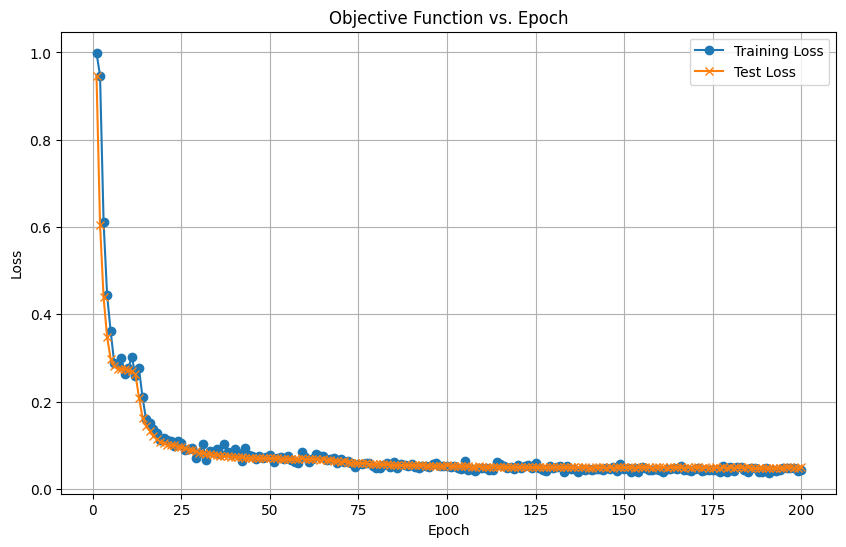

In [208]:
epochs = range(1, len(train_loss) + 1)  # Epochs are 1-based indexing

plt.figure(figsize=(10, 6))
plt.plot(epochs, plot_train_loss, label='Training Loss', marker='o')
plt.plot(epochs, test_loss, label='Test Loss', marker='x')
plt.title('Objective Function vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [209]:
os.getcwd()

'/Users/jeqcho/astro-205/grb'

In [210]:
nr = True
dft = False

fname = "final_dft_Autoencoder_"
if nr:
    fname += "Noise_Reduced_"
fname += f"{swift.res}res_"
fname += f'{"".join(str(b) for b in swift.n_bands)}bands_'
if dft:
    fname += f'DFT_'
# notes
fname += f'final-3-latent'


torch.save(AE.state_dict(), f'{fname}state_dict.pth')
# torch.save(AE, f'{fname}.pth')
print(f"Model saved to  f'{fname}state_dict.pth")

Model saved to  f'final_dft_Autoencoder_Noise_Reduced_64res_12345bands_final-3-latentstate_dict.pth


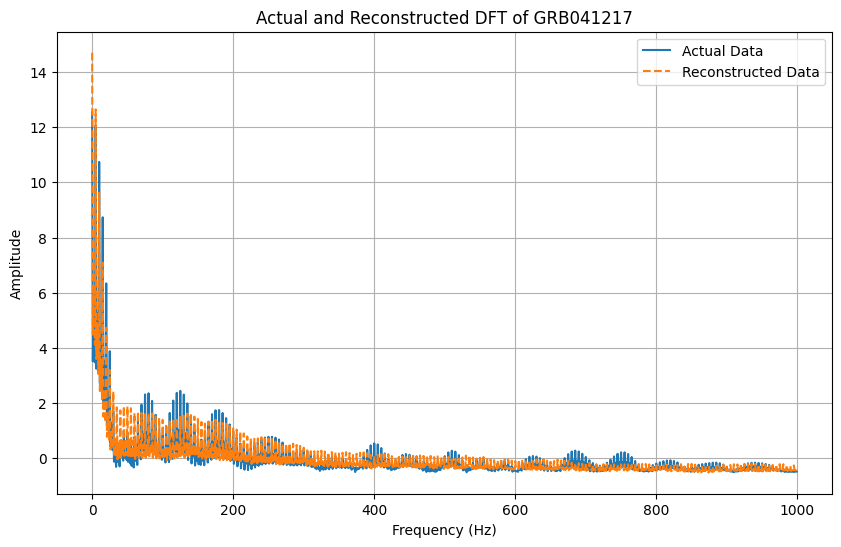

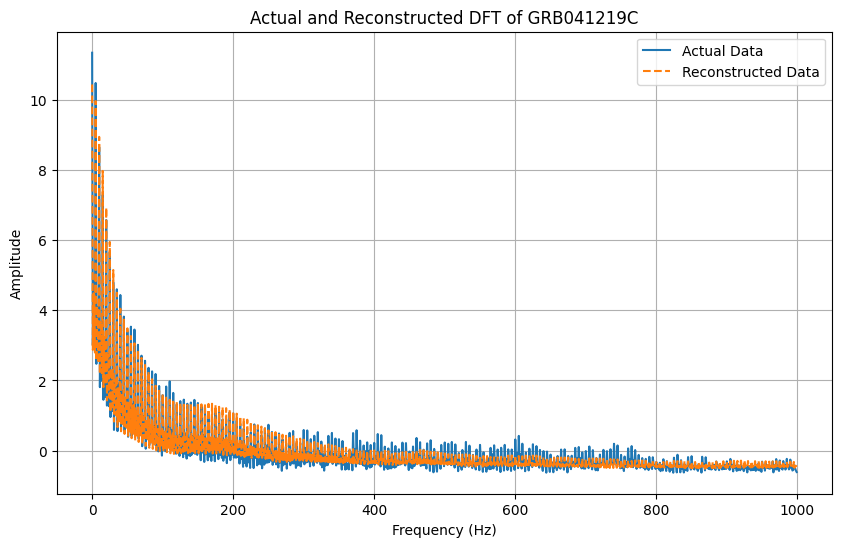

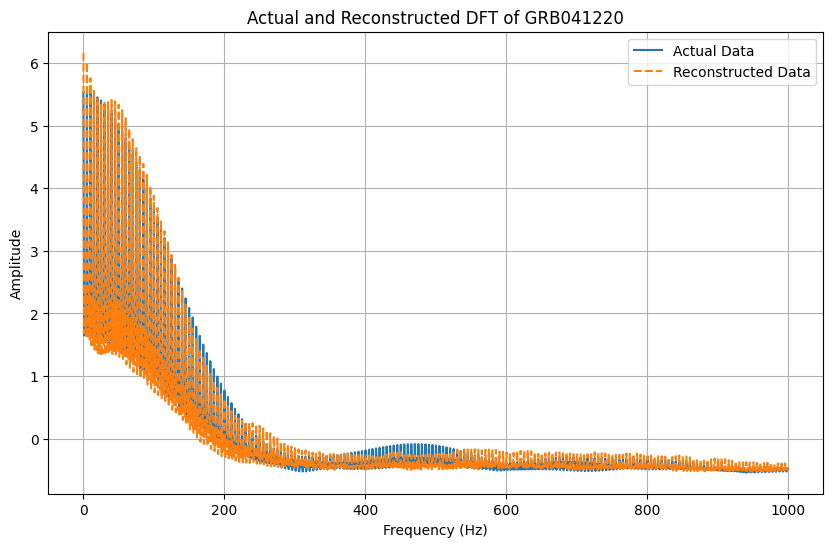

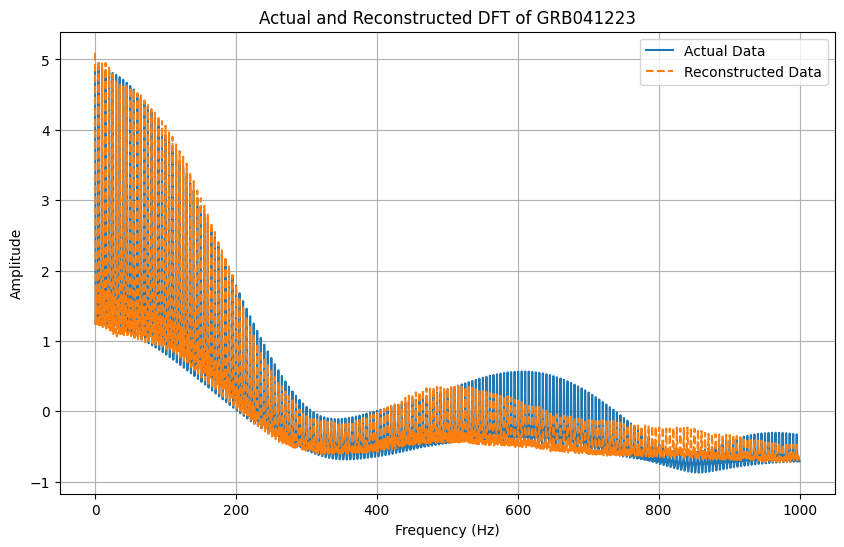

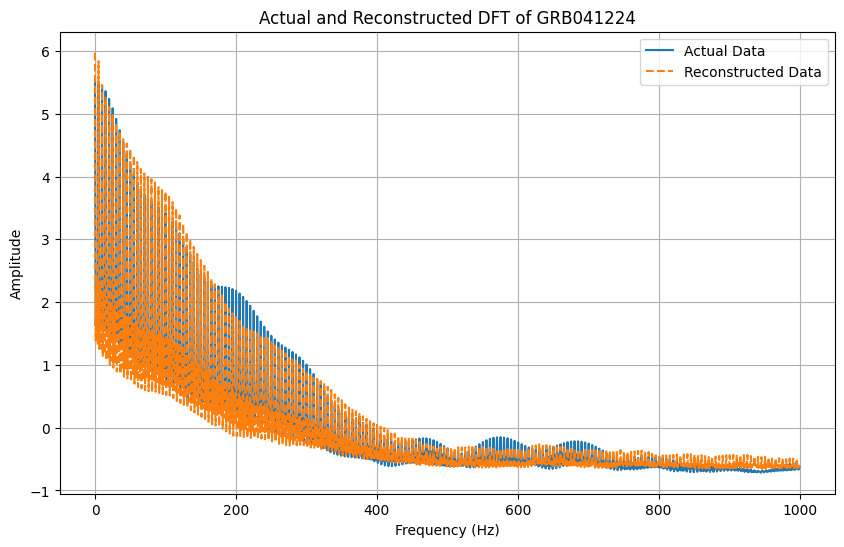

...

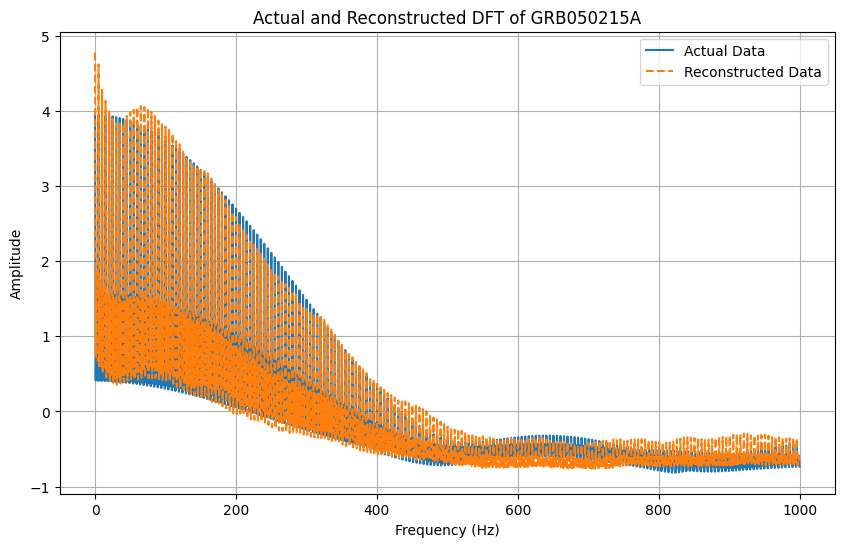

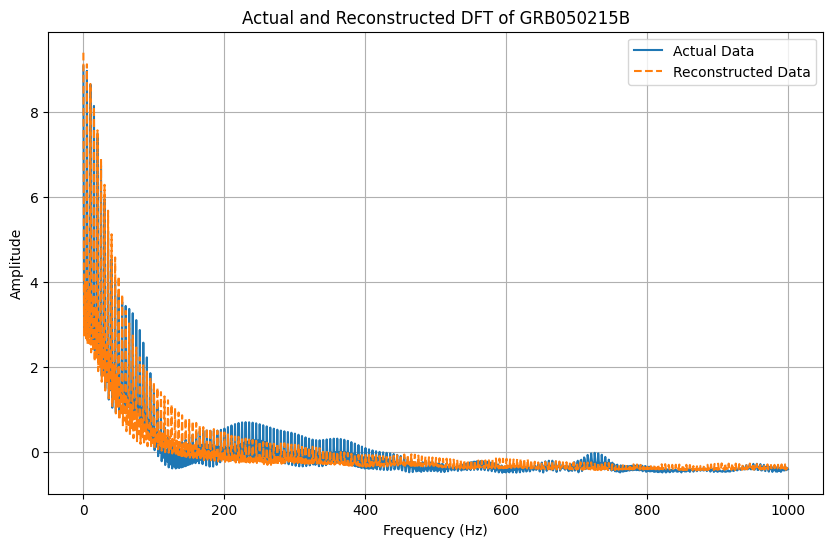

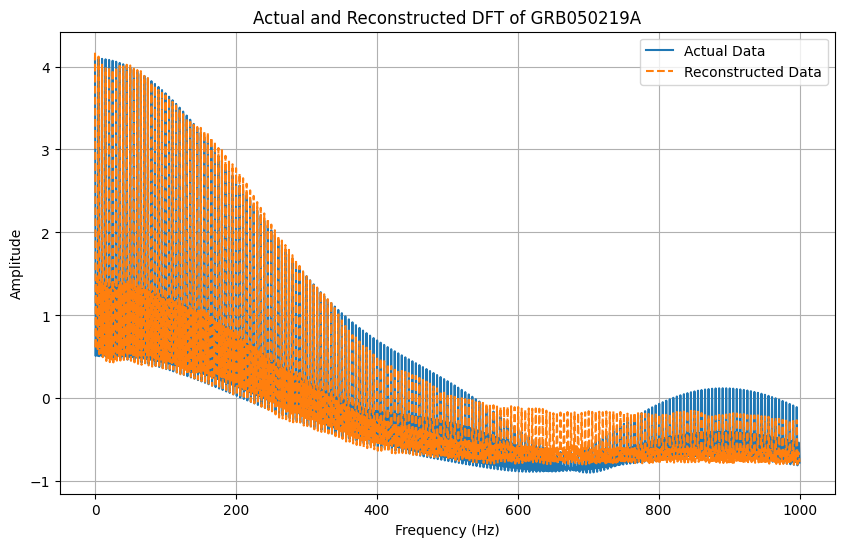

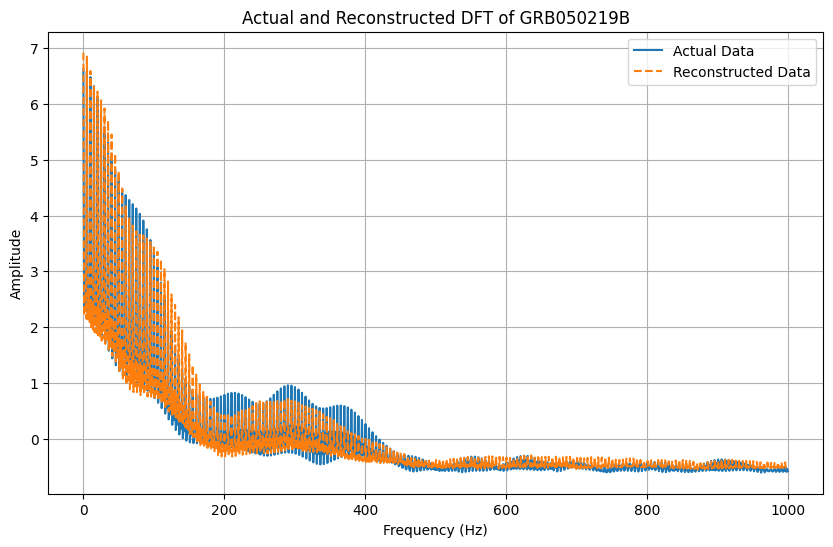

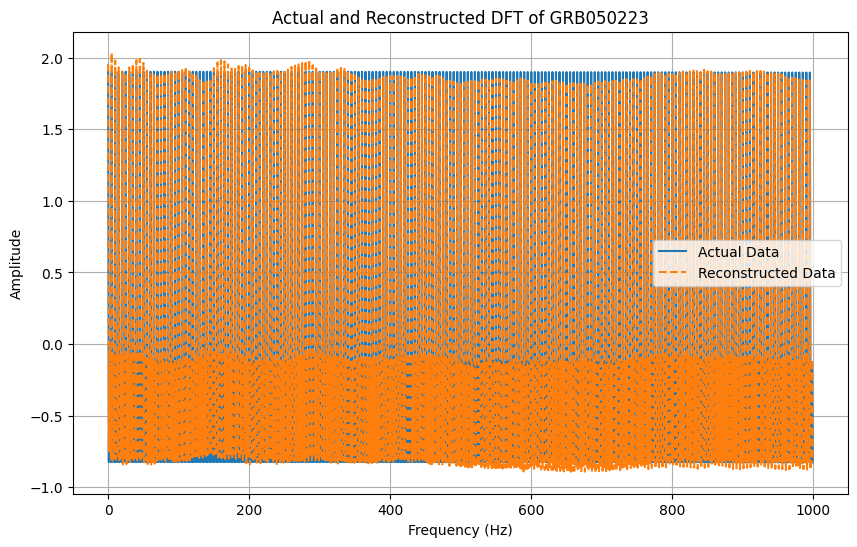

In [211]:
vis_loader = DataLoader(test_dataset, batch_size=16, shuffle=True) # get 16 random spectra

for X_batch, y_batch in vis_loader:
    # Simulated x-axis values for the spectrum
    x = np.linspace(0, features.shape[1], features.shape[1])
    
    with torch.no_grad():
        preds = AE(X_batch).detach()
    
    for i in range(len(X_batch)):
        plt.figure(figsize=(10, 6))
        plt.plot(x, X_batch[i].numpy(), label='Actual Data')  # Converting tensor to numpy array for plotting
        plt.plot(x, preds[i].numpy(), label='Reconstructed Data',linestyle='--')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Amplitude')
        plt.title(f'Actual and Reconstructed DFT of {grb_names[i]}')
        plt.legend()
        plt.grid(True)
    break # just need one batch of 16

In [212]:
preds2 = []
for x in normalized_features:
    with torch.no_grad():
        # Convert x from a NumPy array to a PyTorch tensor
        x_tensor = torch.tensor(x, dtype=torch.float32)
        
        # Add a batch dimension to x
        x_tensor = x_tensor.unsqueeze(0)
        preds2.append(AE.encoder(x_tensor).detach())

preds2 = torch.cat(preds2)
preds2

tensor([[-31.9403,   9.7719,  23.8213, -11.8177,  15.3686],
        [-11.2145,  19.7959,  37.3021, -14.0333,  13.2395],
        [-31.4597,   8.8425,  19.9757, -16.0140,  16.5510],
        ...,
        [-25.3919,  12.9146,  29.6424, -12.5600,  13.3619],
        [-21.4360,  26.1439,  25.8875,   5.1712,  22.4853],
        [ -7.2513,  29.9982,  35.3705,  -5.3215,  10.5204]])

In [213]:
mask = ~torch.isnan(preds2).any(dim=1)
preds2 = preds2[mask]
torch.sum(~mask)

tensor(0)

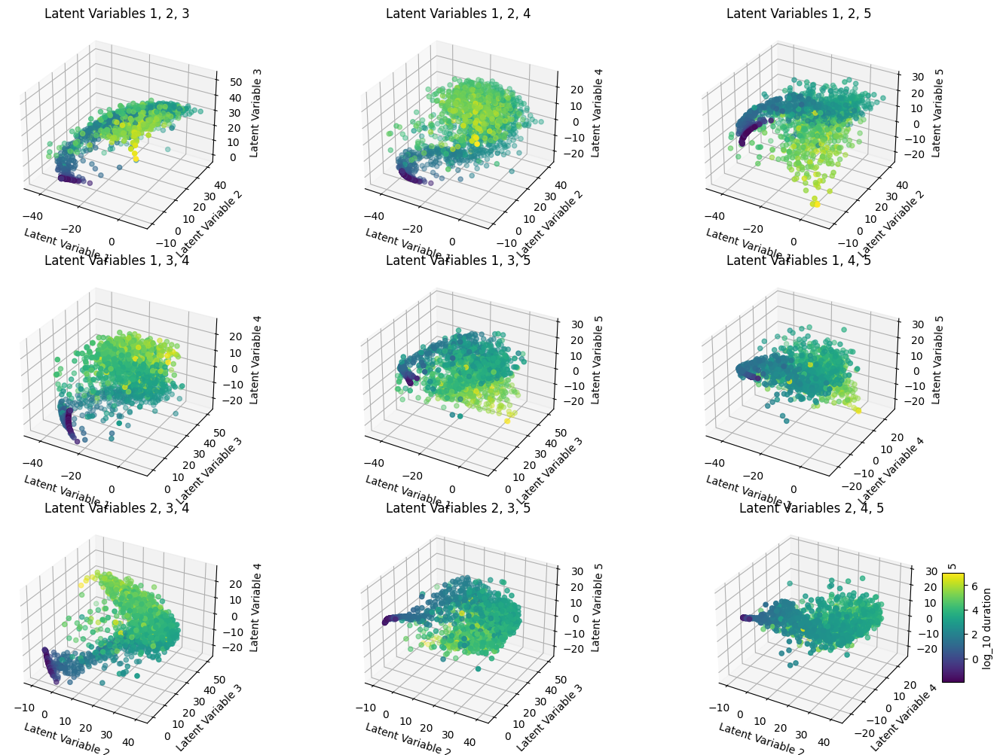

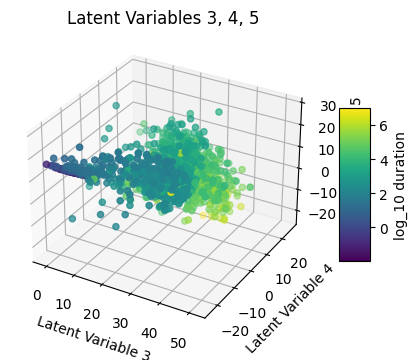

In [214]:
# Get all permutations of three columns out of five (0-based indices)
from itertools import combinations

perms = list(combinations(range(LATENT_SIZE), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                # Use durations for coloring
                scatter = ax.scatter(preds2[:, x], preds2[:, y], preds2[:, z], c=np.log(durations[mask]), cmap='viridis')
                ax.set_xlabel(f'Latent Variable {x+1}')
                ax.set_ylabel(f'Latent Variable {y+1}')
                ax.set_zlabel(f'Latent Variable {z+1}')
                ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')
        plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')  # Add a colorbar with label
        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure


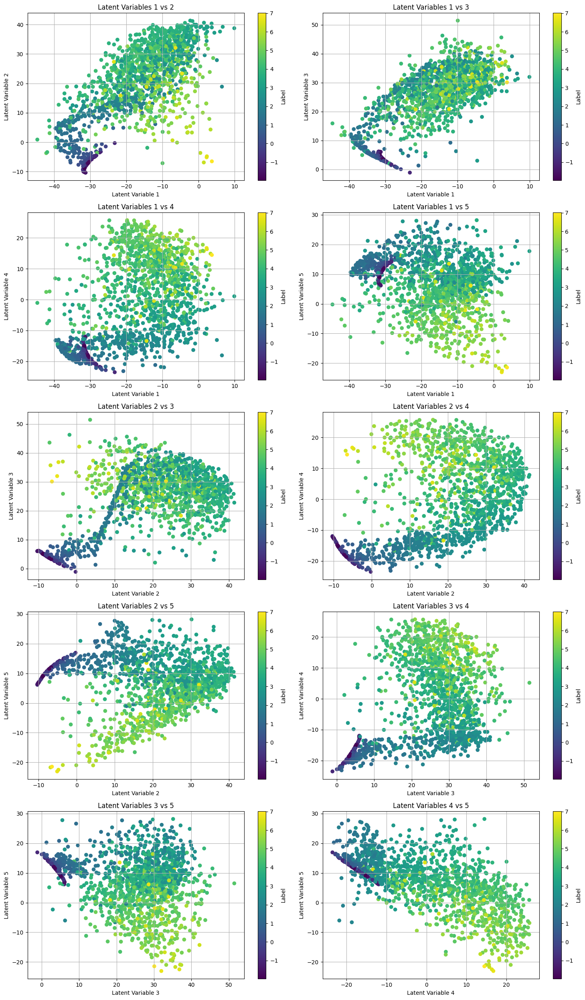

In [215]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(combinations(range(LATENT_SIZE), 2))

# Create plots for all combinations
nrows = 5
ncols = 2
figsize = (15,25)
fig, axs = plt.subplots(nrows, ncols, figsize=figsize)  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    if nrows > 1:
        ax = axs[i//ncols, i%ncols]  # Determine the subplot for the current combo
    else:
        ax = axs[i%ncols]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds2[:, idx1].numpy(), preds2[:, idx2].numpy(), c=np.log(durations[mask]), cmap='viridis')
    ax.set_title(f'Latent Variables {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Latent Variable {idx1+1}')
    ax.set_ylabel(f'Latent Variable {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

In [216]:
compact_mergers = [
    "GRB130603B",
    "GRB060614",
    "GRB080503",
    "GRB050709",
    "GRB050724",
    "GRB061006",
    "GRB070714B",
    "GRB160821B",
    "GRB111005A",
    "GRB150101B",
    "GRB070809",
    "GRB211211A",
    "GRB211227A",
    "GRB191019A",
    "GRB230307A"
]
indices = np.where(np.isin(grb_names, compact_mergers))[0]
mask_not_in_indices = ~np.isin(range(len(preds2)), indices)
# Initialize a dictionary to store the results with the merger names as keys
results = {merger: None for merger in compact_mergers}  # Start with None or any placeholder for not found

In [217]:
from sklearn.cluster import KMeans

encoded2 = preds2
kmeans2 = KMeans(n_clusters=2, random_state=205).fit(encoded2)
kmeans2

KMeans(n_clusters=2, random_state=205)

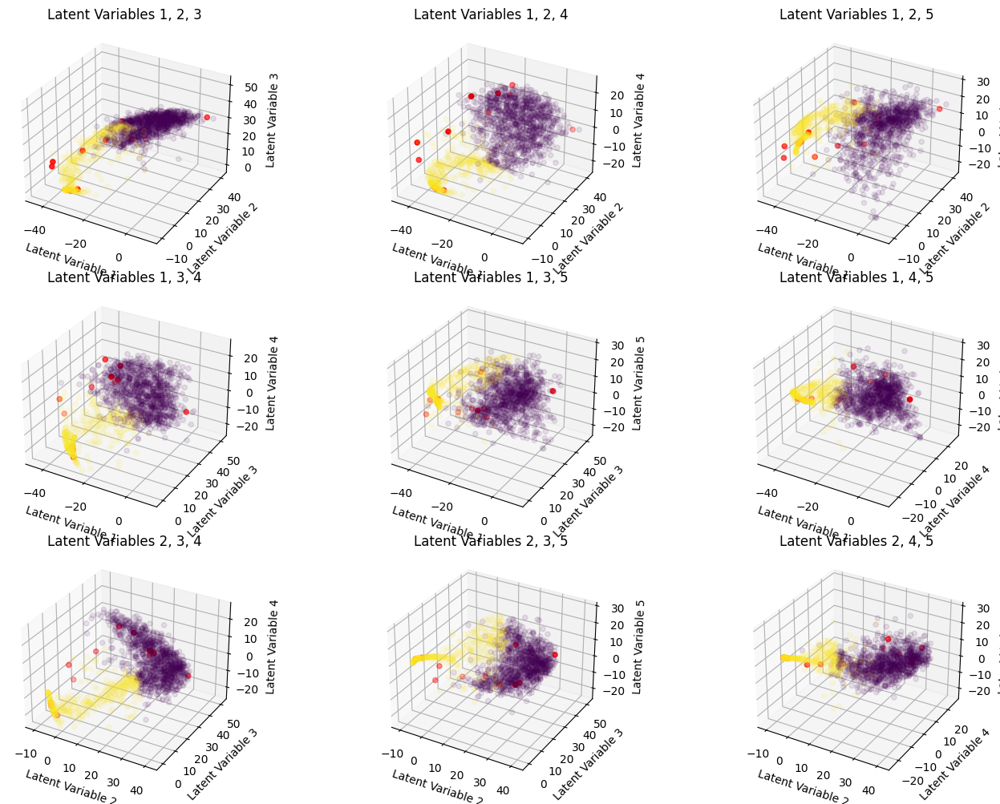

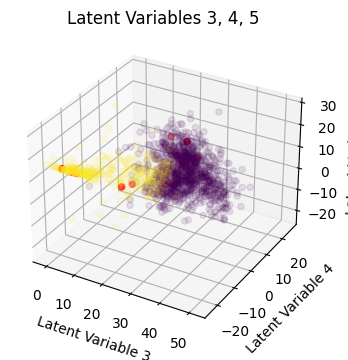

In [218]:
# Get all permutations of three columns out of five (0-based indices)

perms = list(combinations(range(LATENT_SIZE), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], 
                                     c=kmeans2.labels_[mask_not_in_indices], cmap='viridis',alpha=0.1)
                scatter = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], 
                                     c='r')
                ax.set_xlabel(f'Latent Variable {x+1}')
                ax.set_ylabel(f'Latent Variable {y+1}')
                ax.set_zlabel(f'Latent Variable {z+1}')
                ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')

        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure

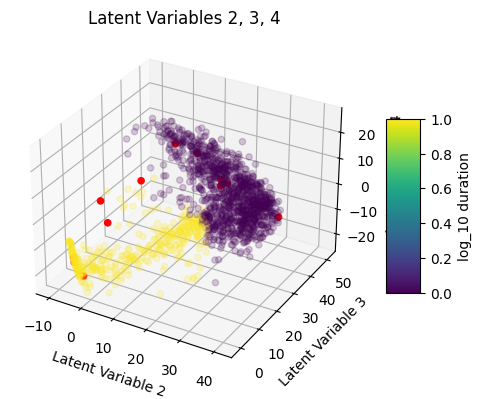

In [219]:
fig = plt.figure(figsize=(6, 4))
x, y, z = [1,2,3]
ax = fig.add_subplot(projection='3d')
# Use durations for coloring
scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], 
                     c=kmeans2.labels_[mask_not_in_indices], cmap='viridis',alpha=0.2)
scatter = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], c='red',alpha=1)
ax.set_xlabel(f'Latent Variable {x+1}')
ax.set_ylabel(f'Latent Variable {y+1}')
ax.set_zlabel(f'Latent Variable {z+1}')
ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')
plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')  # Add a colorbar with label
plt.tight_layout()
plt.show()

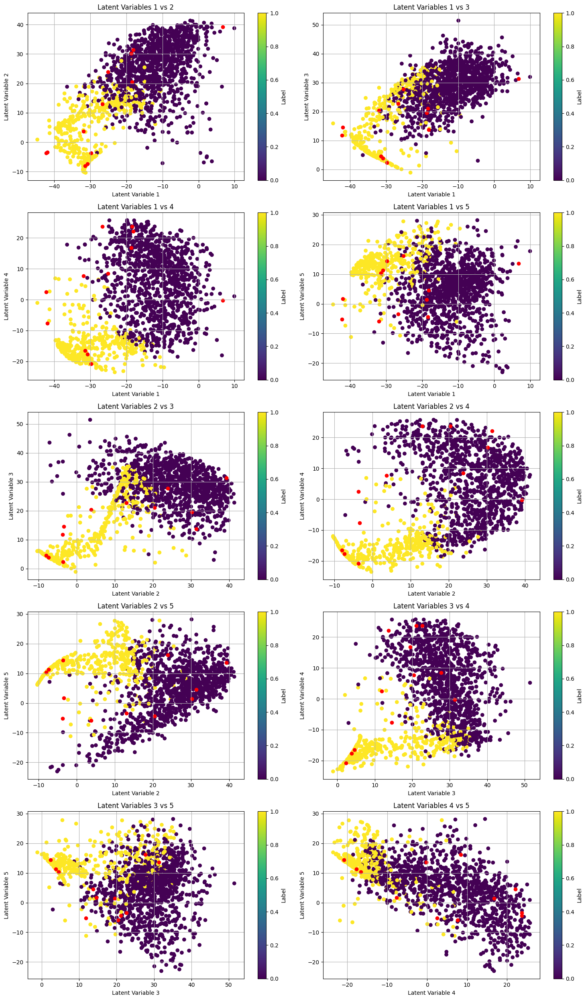

In [220]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(combinations(range(LATENT_SIZE), 2))

# Create plots for all combinations
fig, axs = plt.subplots(nrows, ncols, figsize=figsize)  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    if nrows > 1:
        ax = axs[i//ncols, i%ncols]  # Determine the subplot for the current combo
    else:
        ax = axs[i%ncols]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds2[mask_not_in_indices, idx1].numpy(), preds2[mask_not_in_indices, idx2].numpy(), 
                         c=kmeans2.labels_[mask_not_in_indices], cmap='viridis')
    scatter = ax.scatter(preds2[indices, idx1], preds2[indices, idx2], c='red')
    ax.set_title(f'Latent Variables {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Latent Variable {idx1+1}')
    ax.set_ylabel(f'Latent Variable {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

In [221]:
encoded = preds2

In [222]:
data_loaded = np.load(os.path.join(swift.results_path, f'SWIFT_Noise_Reduced_data_{swift.res}res_{"".join(str(b) for b in swift.n_bands)}bands_DFT_True.npz'))
names_64ms, features_64ms = data_loaded['names'], data_loaded['data']

In [223]:
names_64ms = names_64ms[mask]

In [224]:
# Values
values = np.array([0, 1])

# Normalize the values to the range of the colormap
normalized_values = values / max(values)

# Get the corresponding colormap
cmap = plt.cm.get_cmap('viridis')

# Apply the colormap to normalized values
colors = cmap(normalized_values)

# Print color values
for value, color in zip(values, colors):
    print(f"Value {value} has color: {color}")

Value 0 has color: [0.267004 0.004874 0.329415 1.      ]
Value 1 has color: [0.993248 0.906157 0.143936 1.      ]


In [225]:
colors

array([[0.267004, 0.004874, 0.329415, 1.      ],
       [0.993248, 0.906157, 0.143936, 1.      ]])

Finding Durations: 100%|██████████████████| 1111/1111 [00:05<00:00, 191.03GRB/s]


Text(0.5, 1.0, 'Frequency Histogram of Duration of GRBs using K=2')

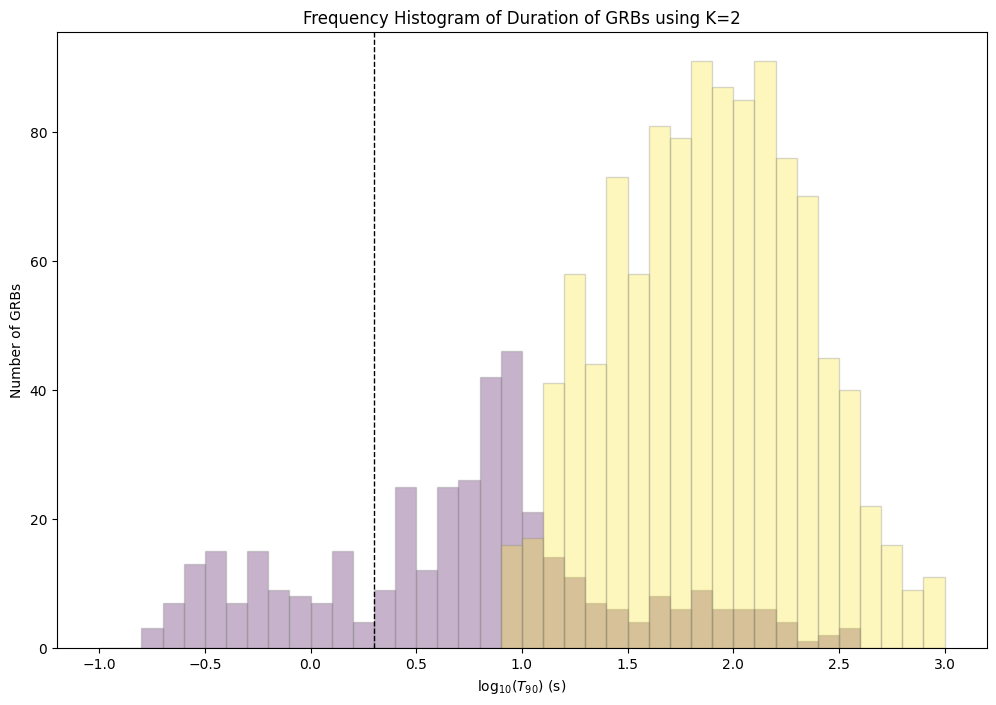

In [226]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
match = kmeans2.labels_==1
match2 = kmeans2.labels_==0
names1 = names_64ms[match]
names2 = names_64ms[match2]
swift.duration_histogram(names=[names1, names2], alpha=0.3, color_groups=colors, ax=ax)
ax.axvline(x=np.log10(2), c='k', ls='--', linewidth=1)
ax.set_xlabel(r'log$_{10}(T_{90})$ (s)')
ax.set_ylabel('Number of GRBs')
ax.set_title('Frequency Histogram of Duration of GRBs using K=2')

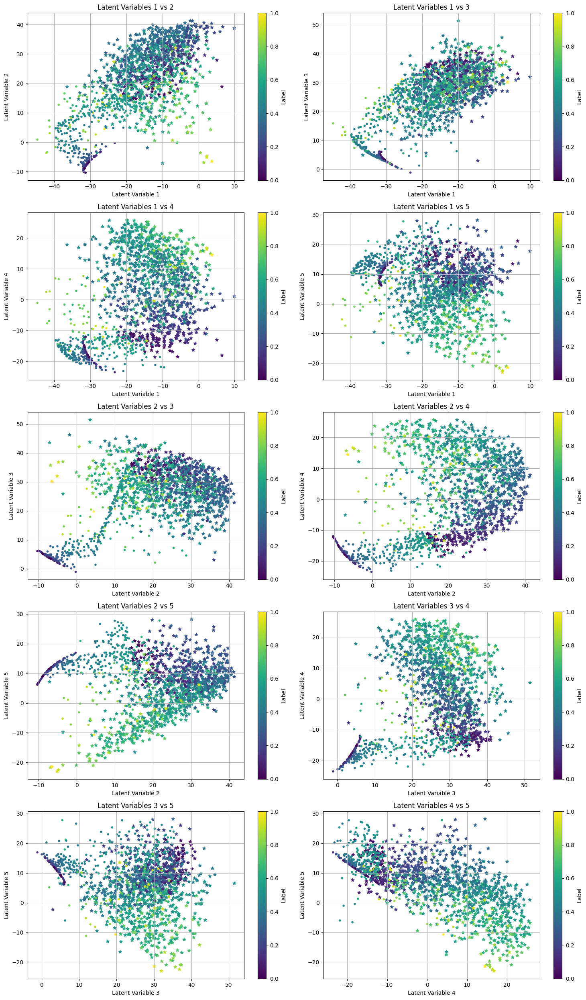

In [227]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(combinations(range(LATENT_SIZE), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=figsize)  # Adjust subplot grid as needed

labls = kmeans2.labels_
centers = kmeans2.cluster_centers_
num_class = max(labls)+1
labls_array = np.array([label.item() for label in labls])
description = ['g1','g2']

markers = ['*', '.']
edgecolors = ['red', 'black']

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    for cluster in range(num_class):
        pred_class_mask = labls == cluster
        ax.scatter(encoded[pred_class_mask,idx1], encoded[pred_class_mask,idx2], 
                   c=np.log(durations[pred_class_mask]), marker=markers[cluster], cmap='viridis')

    # cluster center
    # for idx, center in enumerate(centers):
        # ax.scatter(center[idx1],center[idx2], cmap='viridis', marker='X', s=100, edgecolors='red')

    
    ax.set_title(f'Latent Variables {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Latent Variable {idx1+1}')
    ax.set_ylabel(f'Latent Variable {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

In [228]:
import numpy as np


# Exploring the array
print("Shape of the array:", durations[mask].shape)
print("Data type of the array:", durations[mask].dtype)
print("Number of dimensions:", durations[mask].ndim)
print("Total number of elements:", durations[mask].size)

# Describing the durations[mask]
print("Mean of the array:", np.mean(durations[mask]))
print("Standard deviation:", np.std(durations[mask]))
print("Minimum value:", np.min(durations[mask]))
print("Maximum value:", np.max(durations[mask]))
print("25th percentile:", np.percentile(durations[mask], 25))
print("Median:", np.median(durations[mask]))
print("75th percentile:", np.percentile(durations[mask], 75))
print("90th percentile:", np.percentile(durations[mask], 90))
print("95th percentile:", np.percentile(durations[mask], 95))
print("99th percentile:", np.percentile(durations[mask], 99))

Shape of the array: (1513,)
Data type of the array: float64
Number of dimensions: 1
Total number of elements: 1513
Mean of the array: 76.21325842696629
Standard deviation: 107.63104972105164
Minimum value: 0.14
Maximum value: 1104.7520000000002
25th percentile: 11.904
Median: 41.0
75th percentile: 97.69999999999999
90th percentile: 181.992
95th percentile: 270.82320000000004
99th percentile: 545.7420799999968


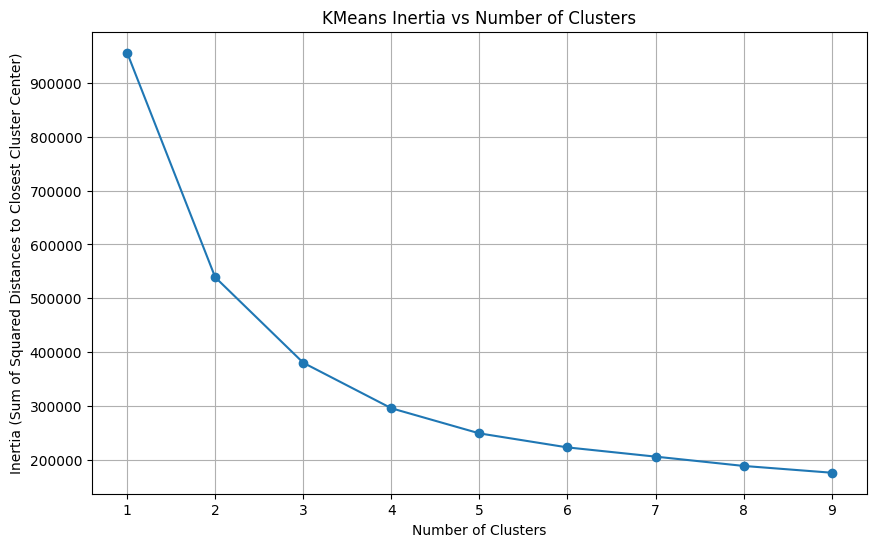

In [229]:
# Try different numbers of clusters
num_clusters = range(1, 10)  # You can adjust the range as needed
inertias = []

for k in num_clusters:
    kmeans = KMeans(n_clusters=k, random_state=205)
    kmeans.fit(encoded2)
    inertias.append(kmeans.inertia_)

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(num_clusters, inertias, marker='o')
plt.title('KMeans Inertia vs Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances to Closest Cluster Center)')
plt.grid(True)
plt.show()

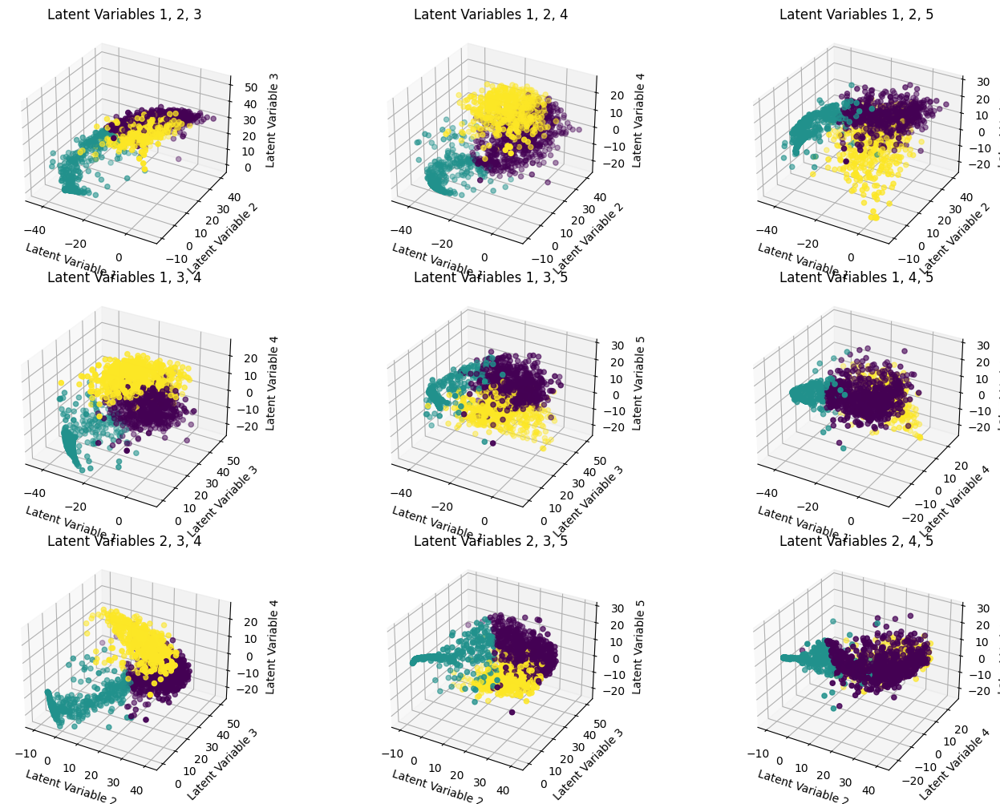

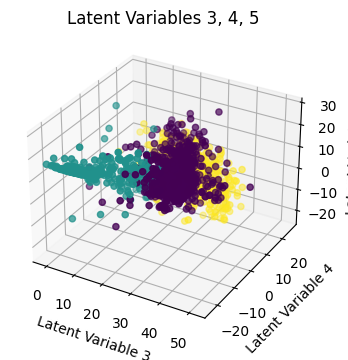

In [230]:
kmeans3 = KMeans(n_clusters=3, random_state=205).fit(encoded2)

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                scatter = ax.scatter(preds2[:, x], preds2[:, y], preds2[:, z], c=kmeans3.labels_, cmap='viridis')
                ax.set_xlabel(f'Latent Variable {x+1}')
                ax.set_ylabel(f'Latent Variable {y+1}')
                ax.set_zlabel(f'Latent Variable {z+1}')
                ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')

        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure

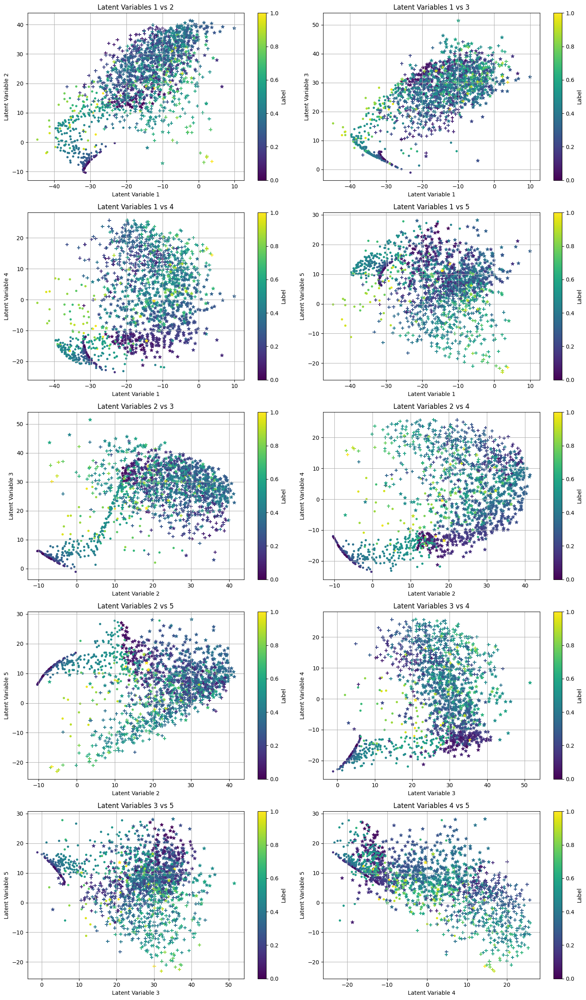

In [231]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(combinations(range(LATENT_SIZE), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=figsize)  # Adjust subplot grid as needed

labls = kmeans3.labels_
centers = kmeans3.cluster_centers_
num_class = max(labls)+1
labls_array = np.array([label.item() for label in labls])
description = ['g1','g2','g3']

markers = ['*', '.','+']
edgecolors = ['red', 'black']

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    for cluster in range(num_class):
        pred_class_mask = labls == cluster
        ax.scatter(encoded[pred_class_mask,idx1], encoded[pred_class_mask,idx2], 
                   c=np.log(durations[pred_class_mask]), marker=markers[cluster], cmap='viridis')

    # cluster center
    # for idx, center in enumerate(centers):
        # ax.scatter(center[idx1],center[idx2], cmap='viridis', marker='X', s=100, edgecolors='red')

    
    ax.set_title(f'Latent Variables {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Latent Variable {idx1+1}')
    ax.set_ylabel(f'Latent Variable {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

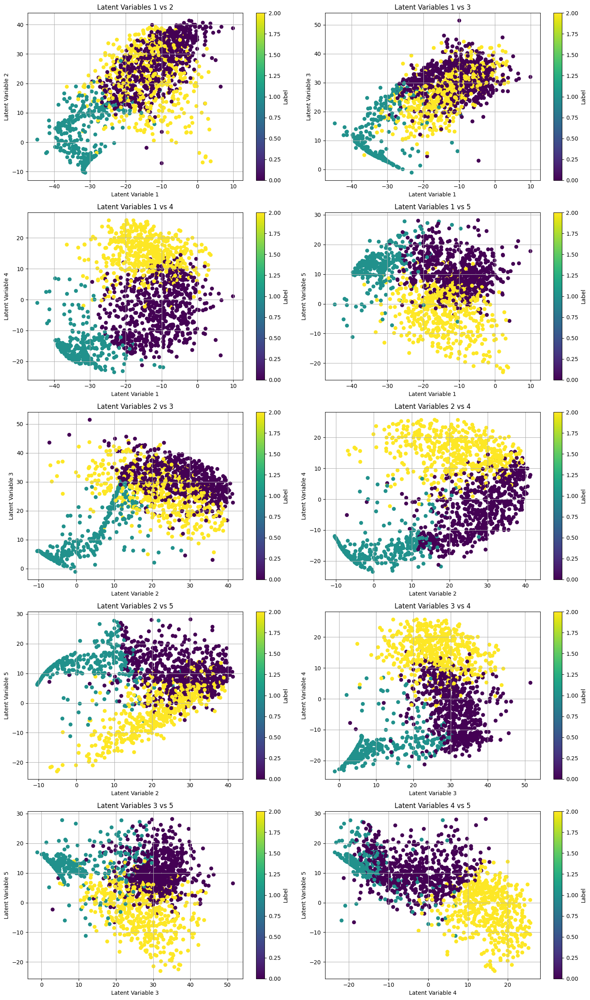

In [232]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(combinations(range(LATENT_SIZE), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=figsize)  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds2[:, idx1].numpy(), preds2[:, idx2].numpy(), c=kmeans3.labels_, cmap='viridis')
    ax.set_title(f'Latent Variables {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Latent Variable {idx1+1}')
    ax.set_ylabel(f'Latent Variable {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

In [233]:
# Values
values = np.arange(3)

# Normalize the values to the range of the colormap
normalized_values = values / max(values)

# Get the corresponding colormap
cmap = plt.cm.get_cmap('viridis')

# Apply the colormap to normalized values
colors = cmap(normalized_values)

# Print color values
for value, color in zip(values, colors):
    print(f"Value {value} has color: {color}")

Value 0 has color: [0.267004 0.004874 0.329415 1.      ]
Value 1 has color: [0.127568 0.566949 0.550556 1.      ]
Value 2 has color: [0.993248 0.906157 0.143936 1.      ]


Finding Durations: 100%|█████████████████████| 519/519 [00:06<00:00, 76.54GRB/s]


Text(0.5, 1.0, 'Frequency Histogram of Duration of GRBs using K=3')

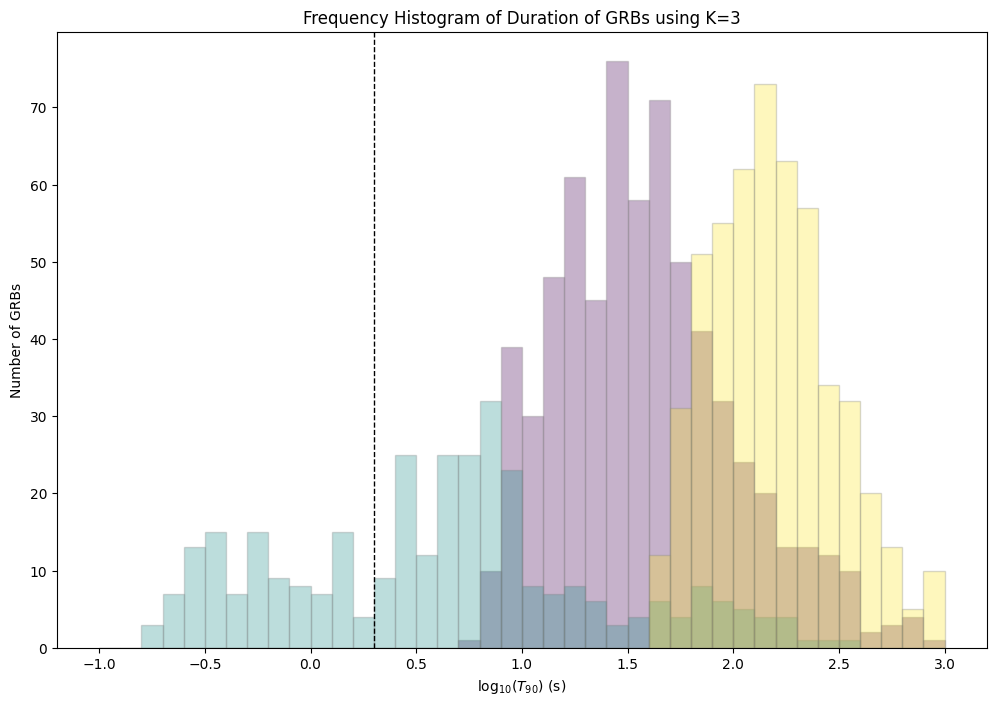

In [234]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
match1 = kmeans3.labels_==0
match2 = kmeans3.labels_==1
match3 = kmeans3.labels_==2
names1 = names_64ms[match1]
names2 = names_64ms[match2]
names3 = names_64ms[match3]
swift.duration_histogram(names=[names1, names2, names3], alpha=0.3, color_groups=colors, ax=ax)
ax.axvline(x=np.log10(2), c='k', ls='--', linewidth=1)
ax.set_xlabel(r'log$_{10}(T_{90})$ (s)')
ax.set_ylabel('Number of GRBs')
ax.set_title('Frequency Histogram of Duration of GRBs using K=3')

In [235]:
torch.sum(~mask)

tensor(0)

In [236]:
# Find indices for each item in compact_mergers within names_64ms
for merger in compact_mergers:
    _indices = np.where(names_64ms == merger)[0]
    results[merger] = _indices[0] if _indices.size > 0 else -1  # Store index if found, else store -1

# Printing the results
for key, value in results.items():
    print(f"{key}: {kmeans2.labels_[value]}")

GRB130603B: 1
GRB060614: 0
GRB080503: 0
GRB050709: 0
GRB050724: 1
GRB061006: 1
GRB070714B: 1
GRB160821B: 1
GRB111005A: 0
GRB150101B: 0
GRB070809: 1
GRB211211A: 0
GRB211227A: 0
GRB191019A: 0
GRB230307A: 0


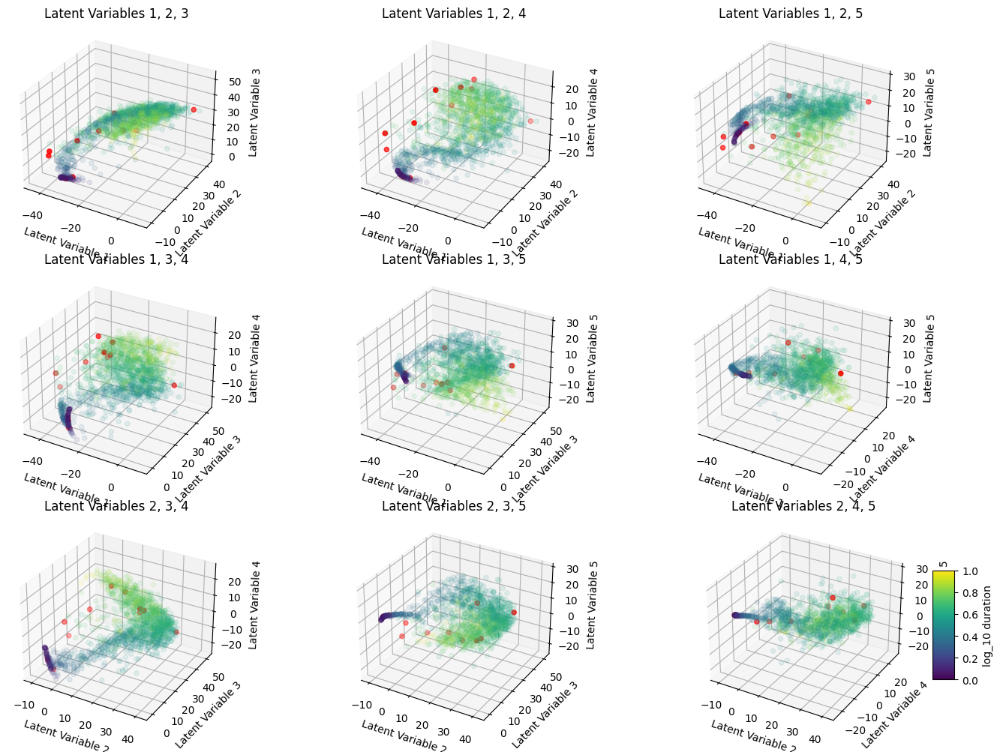

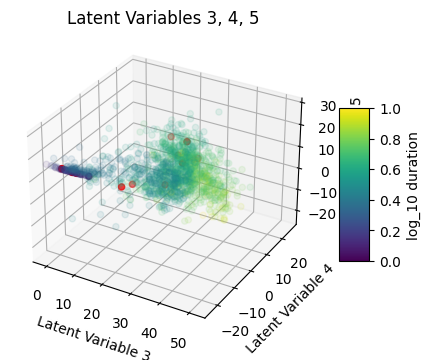

In [237]:
# Get all permutations of three columns out of five (0-based indices)
perms = list(combinations(range(LATENT_SIZE), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                # Use durations for coloring
                scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], c=np.log(durations[mask_not_in_indices]), cmap='viridis',alpha=0.1)
                scatter = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], c='red')
                ax.set_xlabel(f'Latent Variable {x+1}')
                ax.set_ylabel(f'Latent Variable {y+1}')
                ax.set_zlabel(f'Latent Variable {z+1}')
                ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')
        plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')  # Add a colorbar with label
        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure


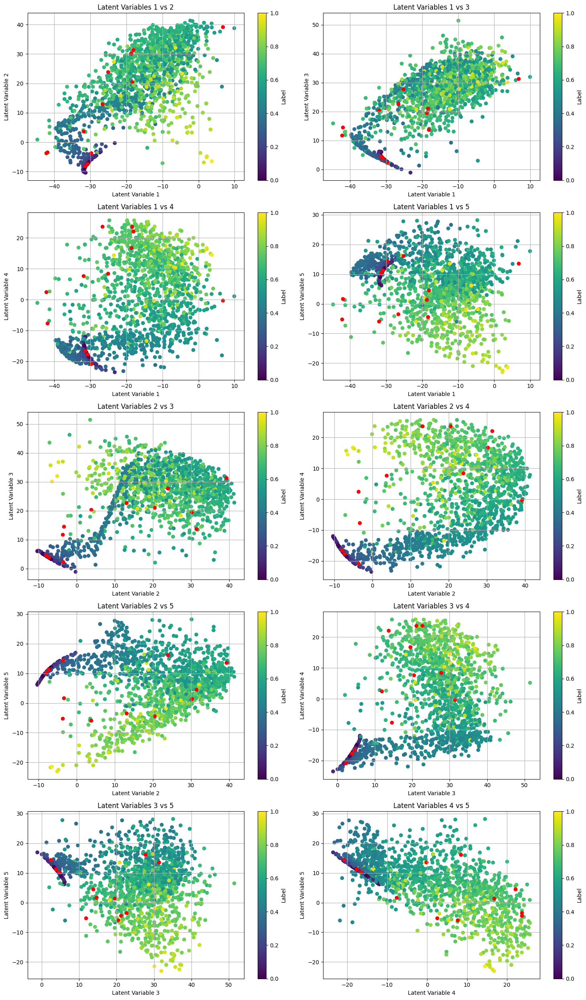

In [238]:
# Generate all combinations of the 5 coordinates taken 2 at a time
combos = list(combinations(range(LATENT_SIZE), 2))

# Create plots for all combinations
fig, axs = plt.subplots(5, 2, figsize=figsize)  # Adjust subplot grid as needed

for i, (idx1, idx2) in enumerate(combos):
    ax = axs[i//2, i%2]  # Determine the subplot for the current combo
    scatter = ax.scatter(preds2[mask_not_in_indices, idx1].numpy(), preds2[mask_not_in_indices, idx2].numpy(), c=np.log(durations[mask_not_in_indices]), cmap='viridis')
    scatter = ax.scatter(preds2[indices, idx1], preds2[indices, idx2], c='red')
    ax.set_title(f'Latent Variables {idx1+1} vs {idx2+1}')
    ax.set_xlabel(f'Latent Variable {idx1+1}')
    ax.set_ylabel(f'Latent Variable {idx2+1}')
    ax.grid(True)

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Label')

plt.tight_layout()
plt.show()

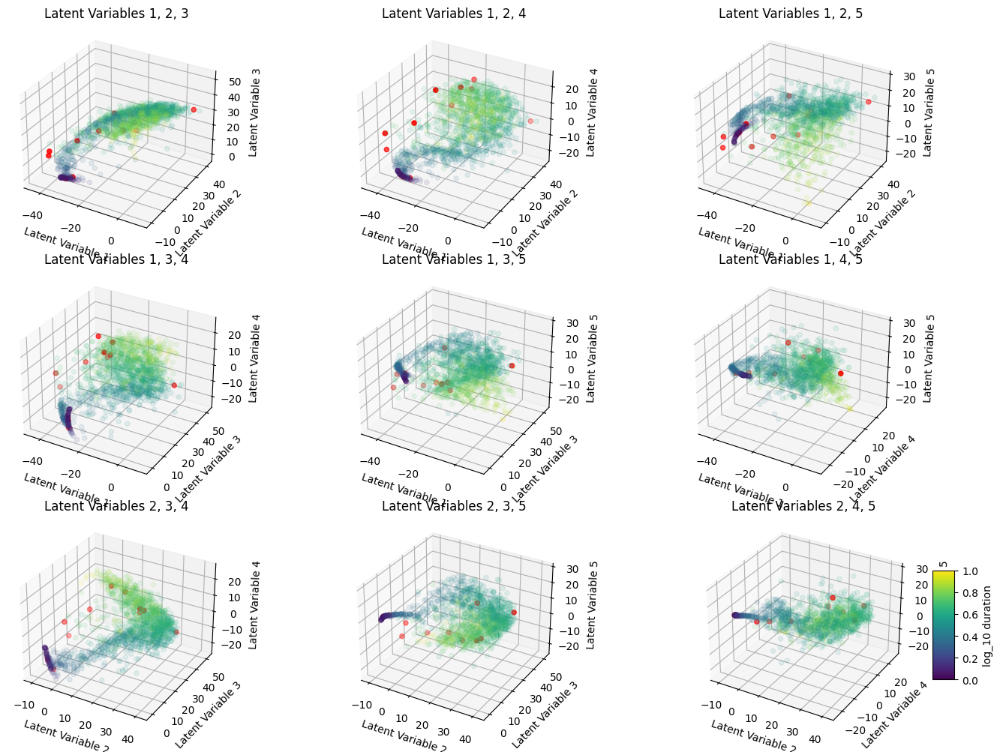

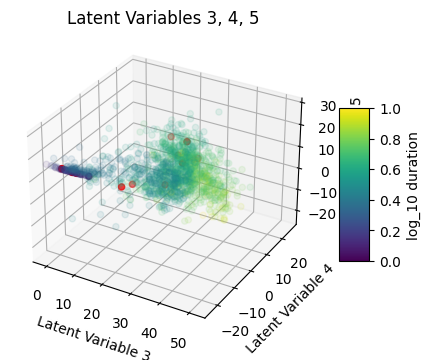

In [239]:
# Get all permutations of three columns out of five (0-based indices)
perms = list(combinations(range(LATENT_SIZE), 3))

# Function to create subplots for permutations
def create_subplots(permutations, rows, cols):
    fig_count = len(permutations) // (rows * cols) + (1 if len(permutations) % (rows * cols) > 0 else 0)
    for f in range(fig_count):
        fig = plt.figure(figsize=(15, 10))
        for i in range(1, rows * cols + 1):
            if rows * cols * f + i - 1 < len(permutations):
                x, y, z = permutations[rows * cols * f + i - 1]
                ax = fig.add_subplot(rows, cols, i, projection='3d')
                # Use durations for coloring
                scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], c=np.log(durations[mask_not_in_indices]), cmap='viridis',alpha=0.1)
                scatter = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], c='red')
                ax.set_xlabel(f'Latent Variable {x+1}')
                ax.set_ylabel(f'Latent Variable {y+1}')
                ax.set_zlabel(f'Latent Variable {z+1}')
                ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')
        plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')  # Add a colorbar with label
        plt.tight_layout()
        plt.show()

# Adjust the number of rows and columns based on how many subplots you want per figure
create_subplots(perms, 3, 3)  # Example: 9 plots per figure


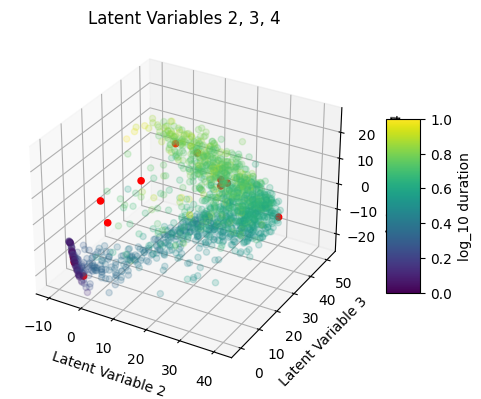

In [240]:
fig = plt.figure(figsize=(6, 4))
x, y, z = [1,2,3]
ax = fig.add_subplot(projection='3d')
# Use durations for coloring
scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], 
                     c=np.log(durations[mask_not_in_indices]), cmap='viridis',alpha=0.2)
scatter = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], c='red',alpha=1)
ax.set_xlabel(f'Latent Variable {x+1}')
ax.set_ylabel(f'Latent Variable {y+1}')
ax.set_zlabel(f'Latent Variable {z+1}')
ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}')
plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')  # Add a colorbar with label
plt.tight_layout()
plt.show()

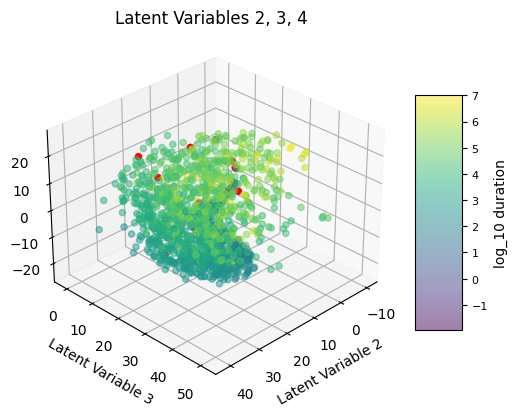

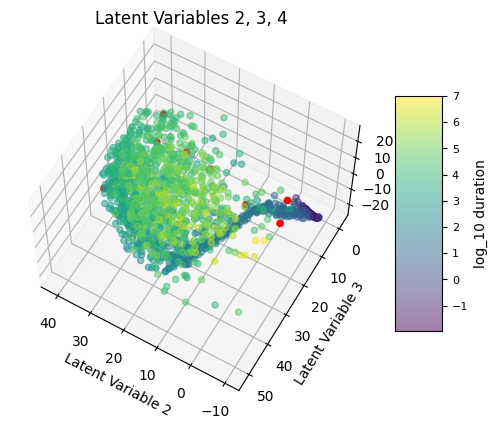

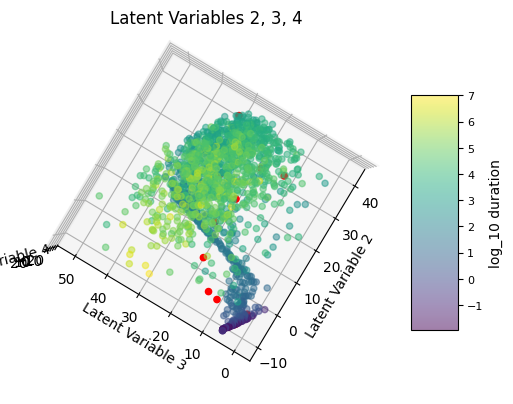

In [241]:
# Define the viewing angles
viewing_angles = [
    (30, 45),
    (60, 120),
    (90, 210)
]
x, y, z = [1,2,3]
# Loop over each angle pair and create a separate plot
for i, (elev, azim) in enumerate(viewing_angles, start=1):
    # Square figsize for clear 3D plots
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(projection='3d')

    # Use durations for coloring
    scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], 
                         c=np.log(durations[mask_not_in_indices]), cmap='viridis', alpha=0.5)
    # Highlighted points
    scatter_highlight = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], c='red', alpha=1)

    # Set labels and title
    ax.set_xlabel(f'Latent Variable {x+1}', fontsize=10)
    ax.set_ylabel(f'Latent Variable {y+1}', fontsize=10)
    ax.set_zlabel(f'Latent Variable {z+1}', fontsize=10)
    ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}', fontsize=12)

    # Set the view angle
    ax.view_init(elev=elev, azim=azim)

    # Add a colorbar with label
    colorbar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')
    colorbar.ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()

    # If you want to save the figure
    # plt.savefig(f'3d_plot_view_{i}.png', bbox_inches='tight')


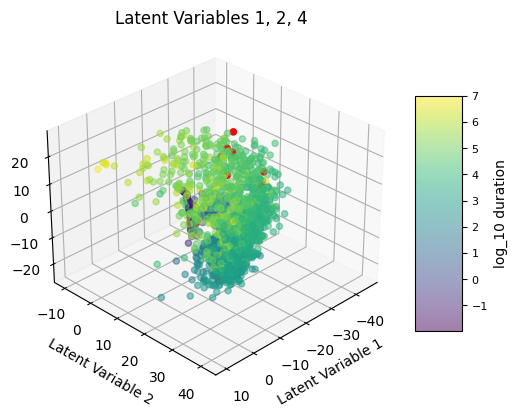

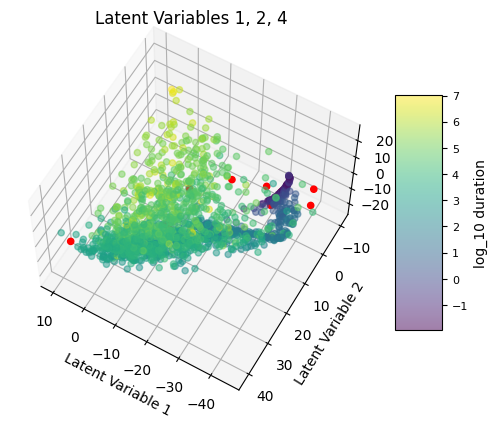

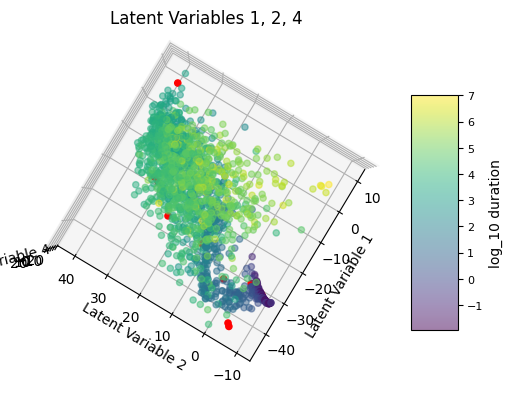

In [242]:
# Define the viewing angles
viewing_angles = [
    (30, 45),
    (60, 120),
    (90, 210)
]
x, y, z = [0,1,3]
# Loop over each angle pair and create a separate plot
for i, (elev, azim) in enumerate(viewing_angles, start=1):
    # Square figsize for clear 3D plots
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(projection='3d')

    # Use durations for coloring
    scatter = ax.scatter(preds2[mask_not_in_indices, x], preds2[mask_not_in_indices, y], preds2[mask_not_in_indices, z], 
                         c=np.log(durations[mask_not_in_indices]), cmap='viridis', alpha=0.5)
    # Highlighted points
    scatter_highlight = ax.scatter(preds2[indices, x], preds2[indices, y], preds2[indices, z], c='red', alpha=1)

    # Set labels and title
    ax.set_xlabel(f'Latent Variable {x+1}', fontsize=10)
    ax.set_ylabel(f'Latent Variable {y+1}', fontsize=10)
    ax.set_zlabel(f'Latent Variable {z+1}', fontsize=10)
    ax.set_title(f'Latent Variables {x+1}, {y+1}, {z+1}', fontsize=12)

    # Set the view angle
    ax.view_init(elev=elev, azim=azim)

    # Add a colorbar with label
    colorbar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5, label='log_10 duration')
    colorbar.ax.tick_params(labelsize=8)

    plt.tight_layout()
    plt.show()

    # If you want to save the figure
    # plt.savefig(f'3d_plot_view_{i}.png', bbox_inches='tight')
